<h2><center> Vibration of a circular cylinder (Force 70Hz)</h2></center>

### *About the problem*

> The mass of the wires generates a fundamental force. Vibration follows, which modifies the static conditions. It would be ideal to always keep the static condition and the dynamic condition apart in this situation.

### *Objective*
> Preprocess the data for develop a  deep learning model capable of separating and identifying the constant forces from the dynamic effects.


### Table of contents:

1. [Importing libraries](#Libraries)
2. [Loading data](#Data)
3. [Exploratory data analysis and preparation](#EDA)
4. [Missing values and duplicates](#Missing)
5. [Statistical summaries and outliers](#Outliers)
6. [Summary](#summary)

<a name="Libraries"></a>
## 1. Importing libraries

In [ ]:
# Import libraries
import scipy.io
from scipy.io import loadmat
from scipy.stats import median_abs_deviation
import torch
from prophet import Prophet
import csv
from IPython.display import Image
import matplotlib.pyplot as plt
import plotly.express as px
import pandas as pd
import numpy as np
import seaborn as sns
import scipy.stats as stats
from scipy.stats import norm
from functools import partial
import operator, statistics
from statistics import mean
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go

<a name="Data"></a>
## 2. Loading and previewing data

In [ ]:
# Load the data from the MATLAB file
mat = scipy.io.loadmat('forces_19200Hz.mat')

In [ ]:
# Create a datframe
df = pd.DataFrame({"channel1":mat["Channel_1_Data"].reshape(-1),
                   "channel2":mat["Channel_2_Data"].reshape(-1),
                   "channel3":mat["Channel_3_Data"].reshape(-1),
                   "channel4":mat["Channel_4_Data"].reshape(-1)
                  })

In [ ]:
# Preview the data (rows and columns)
mat["Channel_1_Data"].shape,mat["Channel_2_Data"].shape,mat["Channel_3_Data"].shape,mat["Channel_4_Data"].shape

((202258, 1), (202258, 1), (202258, 1), (202258, 1))

In [ ]:
# Preview the first five rows of the data
df.head()

,channel1,channel2,channel3,channel4
0,0.000000,-6.946352,4.322061,-230.529480
1,0.000052,-6.958218,4.302786,-230.301025
2,0.000104,-7.024863,4.293033,-230.207413
3,0.000156,-7.008965,4.189758,-229.683380
4,0.000208,-7.140053,4.033864,-229.507507


In [ ]:
# Preview the last five rows of the data
df.tail()

,channel1,channel2,channel3,channel4
202253,10.534011,-6.980247,4.236019,-229.696365
202254,10.534063,-7.035764,4.193503,-229.530411
202255,10.534115,-6.954062,4.189852,-229.680573
202256,10.534167,-6.875532,4.191372,-229.945358
202257,10.534219,-6.758492,4.217391,-230.209320


In [ ]:
# Check the column names and datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 202258 entries, 0 to 202257
Data columns (total 4 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   channel1  202258 non-null  float64
 1   channel2  202258 non-null  float64
 2   channel3  202258 non-null  float64
 3   channel4  202258 non-null  float64
dtypes: float64(4)
memory usage: 6.2 MB


<a name="EDA"></a>
## 3. Exploratory data analysis  and preparation

In [ ]:
# Renaming the columns to new names
df.rename(columns = {'channel1':'Time', 'channel2':'F_x', 'channel3':'F_y', 'channel4':'F_z'}, inplace = True)
print(df.columns)

Index(['Time', 'F_x', 'F_y', 'F_z'], dtype='object')


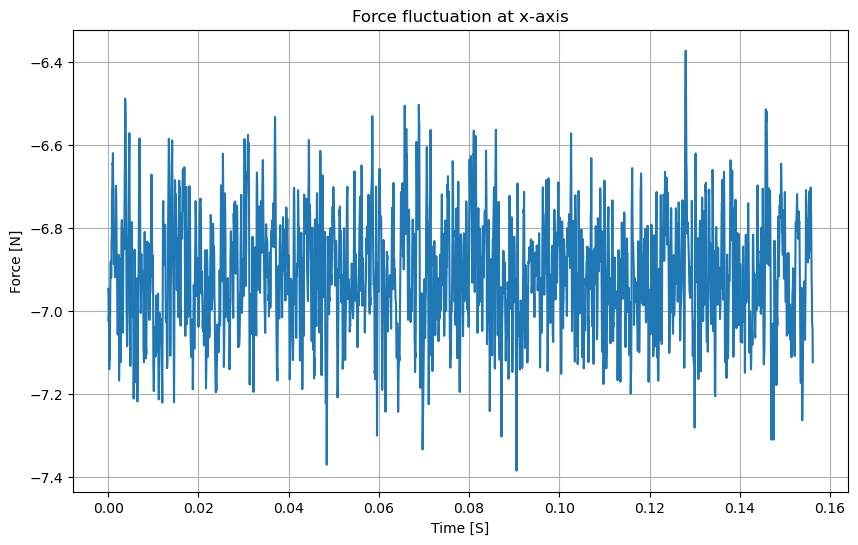

In [ ]:
# Visualize the data at X-axis
plt.figure(figsize=(10, 6))
plt.plot(df["Time"][:3000],df["F_x"][:3000])
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.title('Force fluctuation at x-axis')
plt.grid(True)
plt.show()

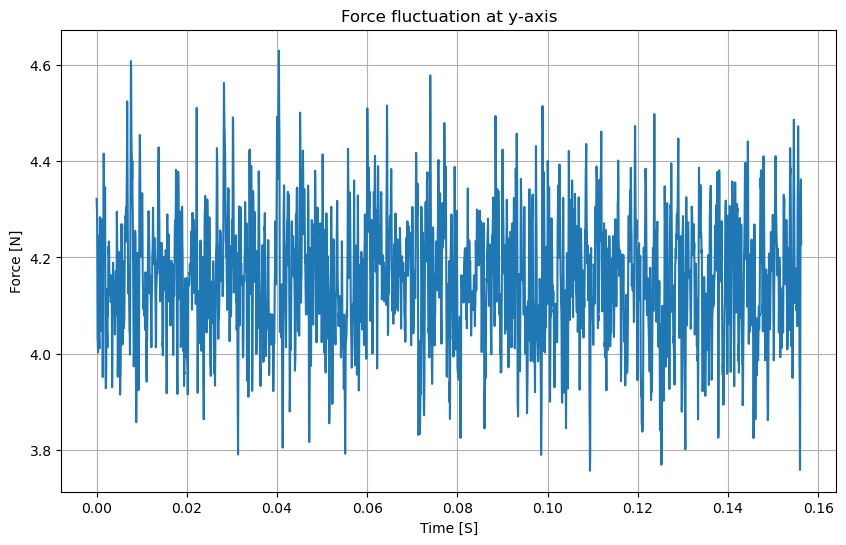

In [ ]:
# Visualize the data at Y-axis
plt.figure(figsize=(10, 6))
plt.plot(df["Time"][:3000],df["F_y"][:3000])
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.title('Force fluctuation at y-axis')
plt.grid(True)
plt.show()

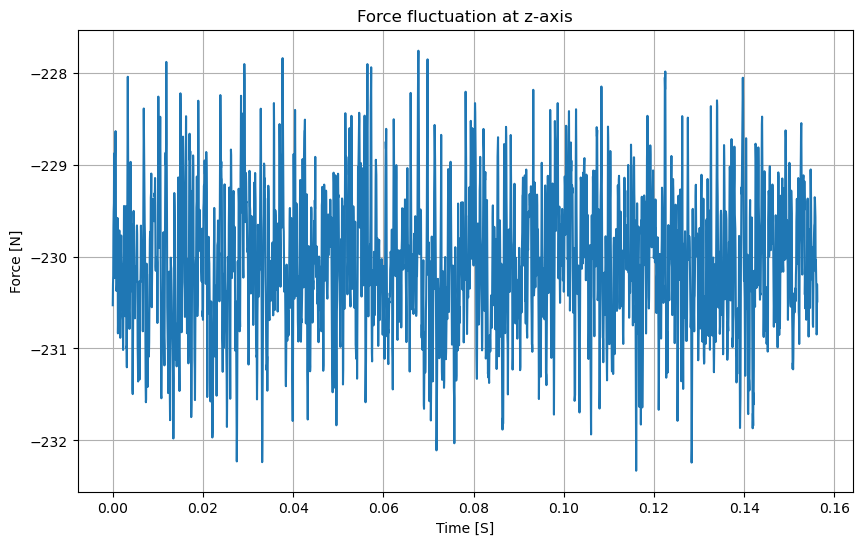

In [ ]:
# Visualize the data at Z-axis
plt.figure(figsize=(10, 6))
plt.plot(df["Time"][:3000],df["F_z"][:3000])
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.title('Force fluctuation at z-axis')
plt.grid(True)
plt.show()

<a name="Missing"></a>
## 4. Missing values and duplicates

In [ ]:
# Check for missing values
pd.isna(df)

,Time,F_x,F_y,F_z
0,False,False,False,False
1,False,False,False,False
2,False,False,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
202253,False,False,False,False
202254,False,False,False,False
202255,False,False,False,False
202256,False,False,False,False


In [ ]:
# Checking for isna function
dfn= df
pd.isna(dfn)

,Time,F_x,F_y,F_z
0,False,False,False,False
1,False,False,False,False
2,False,False,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
202253,False,False,False,False
202254,False,False,False,False
202255,False,False,False,False
202256,False,False,False,False


In [ ]:
# Inserting a null value to dataframe in F_x

dfn.loc[0, 'F_x'] = np.nan

# Checking the modification
pd.isna(dfn)

,Time,F_x,F_y,F_z
0,False,True,False,False
1,False,False,False,False
2,False,False,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
202253,False,False,False,False
202254,False,False,False,False
202255,False,False,False,False
202256,False,False,False,False


In [ ]:
# Inserting the original value to dataframe in F_x

dfn.loc[0, 'F_x'] = -6.946352

# Checking the modification
pd.isna(dfn)


,Time,F_x,F_y,F_z
0,False,False,False,False
1,False,False,False,False
2,False,False,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
202253,False,False,False,False
202254,False,False,False,False
202255,False,False,False,False
202256,False,False,False,False


In [ ]:
# Check for duplicates
df["F_x"].duplicated().any(), df["F_y"].duplicated().any(), df["F_z"].duplicated().any()

(True, True, True)

<a name="Outliers"></a>
## 5. Statistical summaries and outliers

In [ ]:
# Statistical summary for the data
df.describe()

,Time,F_x,F_y,F_z
count,202258.000000,202258.000000,202258.000000,202258.000000
mean,5.267110,-6.906073,4.155663,-230.064935
std,3.040990,0.134107,0.127729,0.718904
min,0.000000,-7.647522,3.603116,-233.132812
25%,2.633555,-6.996184,4.070102,-230.547417
50%,5.267110,-6.905703,4.155595,-230.062897
75%,7.900664,-6.815870,4.241291,-229.581394
max,10.534219,-6.218502,4.757855,-226.873367


#### Outliers can significantly impact the results of data analysis, causing incorrect conclusions and decisions. There are many techniques for detecting and handling the outliers in the data before modeling. I will apply the hampel filter technique for detecting the outliers.
##### Hampel filter is an algorithm that uses Median Absolute Deviation and Median instead of Mean and Standard Deviation, making it more robust to outliers.
##### In this case we will set a several values for the Hampel filter parameters (window_size and sigma).

In [ ]:
# Defining the hampel filter/function to detect and handling the outliers

def hampel_filter(df, window_size, n_sigma):
    filtered_data = df.copy()
    outliers = {}

    for column in df.columns[1:2]:
        column_outliers = {}

        for i in range(len(df)):
            start_index = max(0, i - window_size)
            end_index = min(len(df), i + window_size + 1)
            window = df.iloc[start_index:end_index][column]

            median = np.median(window)
            deviation = np.median(np.abs(window - median))
            threshold = n_sigma * deviation

            if np.abs(df[column][i] - median) > threshold:
                outlier_value = df[column][i]
                filtered_data[column][i] = median
                column_outliers[i] = outlier_value

        outliers[column] = column_outliers

    for column, column_outliers in outliers.items():
        time_values = df['Time'].iloc[list(column_outliers.keys())]
        outliers[column] = {index: {'value': value, 'time': time_values[index]} for index, value in column_outliers.items()}

    return filtered_data, outliers

### Applying the Hampel filter with setting window_size=20 and sigma=5

#### Hampel filter for X-axis with window_size=20 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_x"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=20, n_sigma=5)

In [ ]:
# Statistical summary for the original data on X-axis
df[['Time', 'F_x']][:3000].describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911108
std,0.045113,0.134965
min,0.000000,-7.384572
25%,0.039049,-7.002866
50%,0.078099,-6.916395
75%,0.117148,-6.818836
max,0.156198,-6.372138


In [ ]:
# Statistical summary for the filtered data with window_size=20 and n_sigma=5 on X-axis
filtered_data.describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911773
std,0.045113,0.133986
min,0.000000,-7.384572
25%,0.039049,-7.002846
50%,0.078099,-6.917248
75%,0.117148,-6.820470
max,0.156198,-6.372138


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_x']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_x)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_x']:
    original_value = subset.loc[index, 'F_x']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_x'] for index in outliers['F_x']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the X-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the X-axis:", len(new_values))


Number of original outliers on the X-axis: 13
Number of filtered outliers on the X-axis: 13


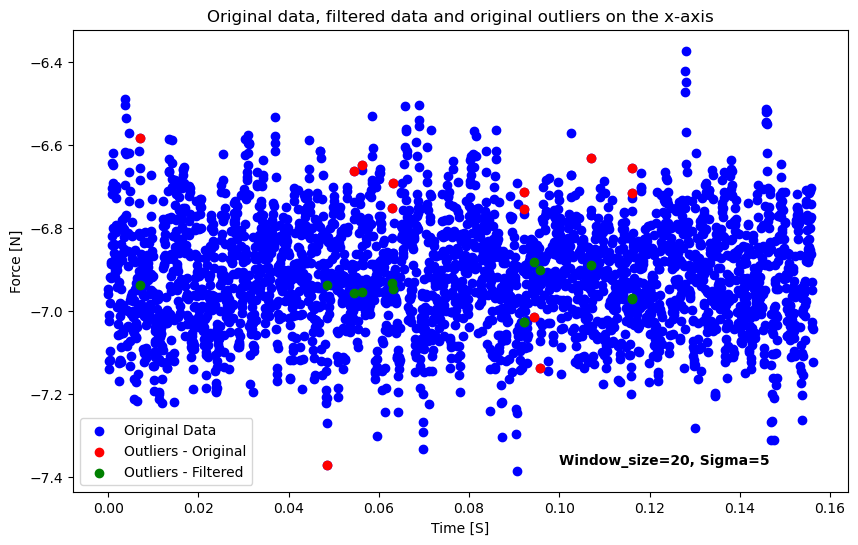

In [ ]:
# Plot the original data, filtered data and original outliers on the X-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_x'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.10, -7.37, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

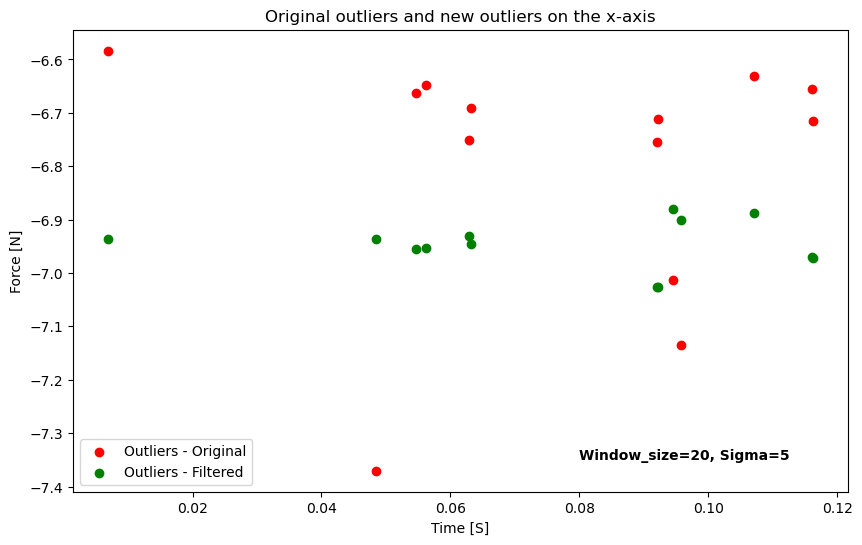

In [ ]:
# Scatter plot for original outliers and new outliers on the x-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.08, -7.35, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()


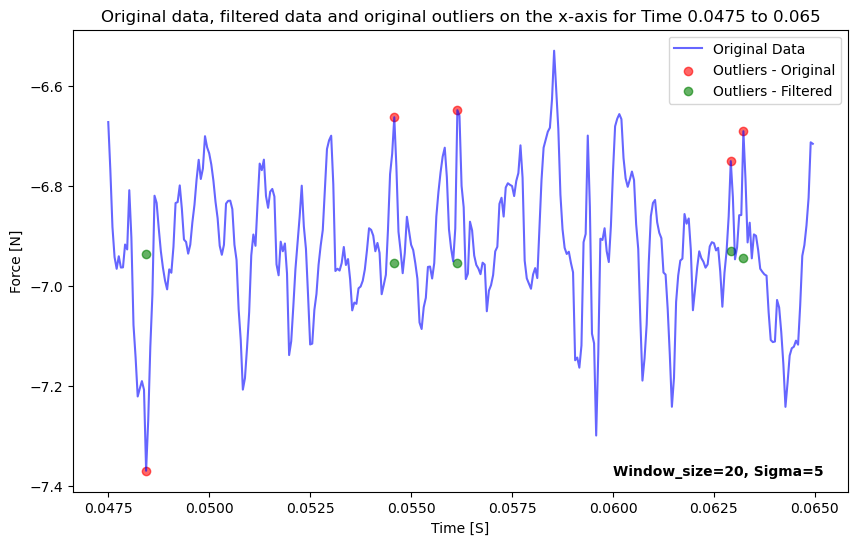

In [ ]:
# Filter dataframe for specified time range
subset_range = subset[(subset['Time'] >= 0.0475) & (subset['Time'] <= 0.065)]

# Calculate outliers for new time range
outliers_time_range = [time for time in outliers_time if 0.0475 <= time <= 0.065]
outliers_values_range = [value for time, value in zip(outliers_time, outliers_values) if 0.0475 <= time <= 0.065]
new_values_range = [value for time, value in zip(outliers_time, new_values) if 0.0475 <= time <= 0.065]

plt.figure(figsize=(10, 6))
plt.plot(subset_range['Time'], subset_range['F_x'], color='b', label='Original Data', alpha=0.6)
plt.scatter(outliers_time_range, outliers_values_range, color="r", label="Outliers - Original", alpha=0.6)
plt.scatter(outliers_time_range, new_values_range, color="g", label="Outliers - Filtered", alpha=0.6)
plt.title('Original data, filtered data and original outliers on the x-axis for Time 0.0475 to 0.065')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.06, -7.38, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()


#### Hampel filter for Y-axis with window_size=20 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_y"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=20, n_sigma=5)

In [ ]:
# Statistical summary for the original data on Y-axis
df[['Time', 'F_y']][:3000].describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.152833
std,0.045113,0.127727
min,0.000000,3.756379
25%,0.039049,4.067976
50%,0.078099,4.152617
75%,0.117148,4.234664
max,0.156198,4.630175


In [ ]:
# Statistical summary for the filtered data with window_size=20 and n_sigma=5 on Y-axis
filtered_data.describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.153195
std,0.045113,0.125335
min,0.000000,3.757986
25%,0.039049,4.070249
50%,0.078099,4.152650
75%,0.117148,4.233815
max,0.156198,4.630175


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_y']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_y)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_y']:
    original_value = subset.loc[index, 'F_y']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_y'] for index in outliers['F_y']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Y-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Y-axis:", len(new_values))

Number of original outliers on the Y-axis: 22
Number of filtered outliers on the Y-axis: 22


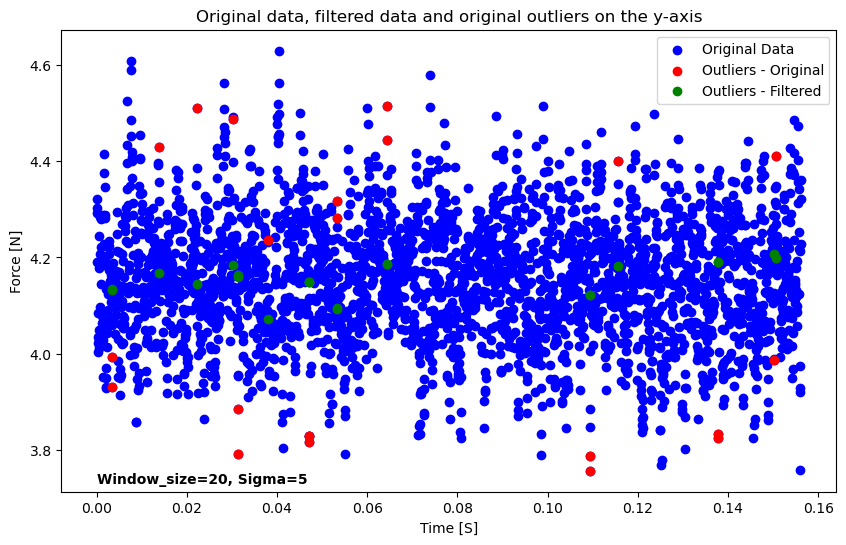

In [ ]:
# Plot the original data, filtered data and original outliers on the Y-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_y'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.00, 3.73, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

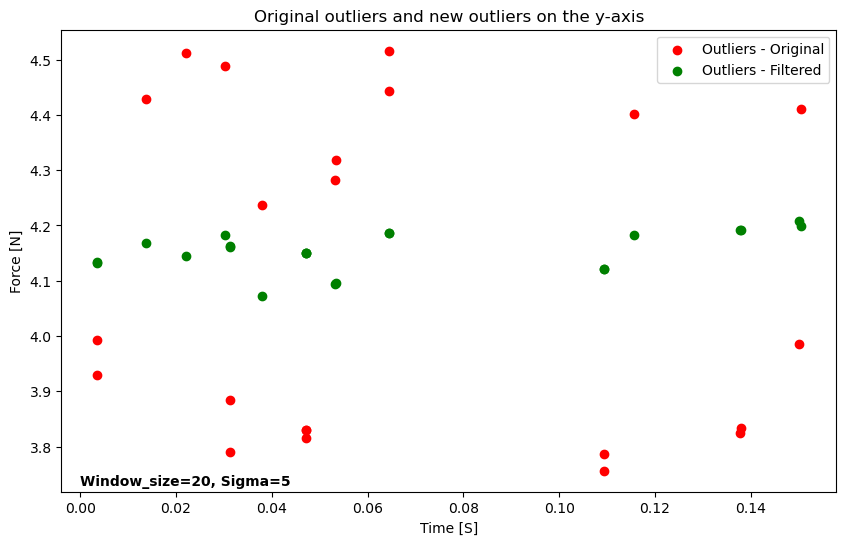

In [ ]:
# Scatter plot for original outliers and new outliers on the y-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.00, 3.73, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

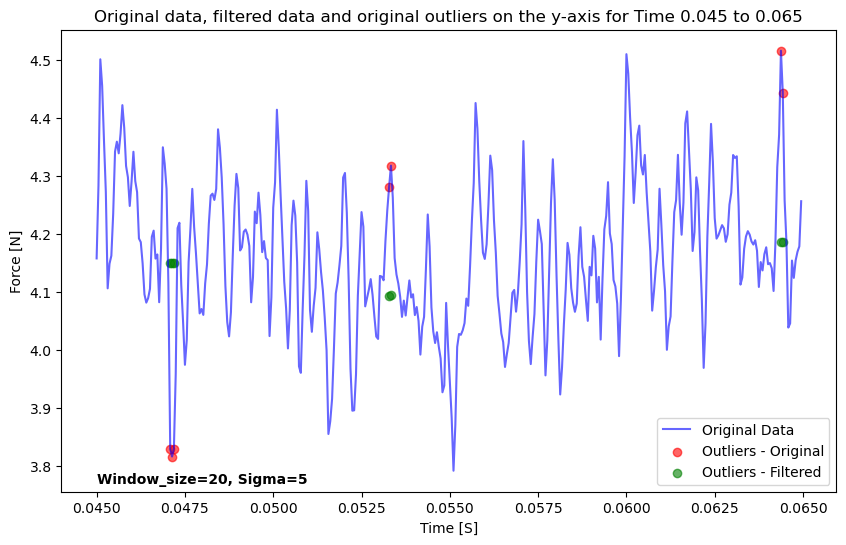

In [ ]:
# Filter dataframe for specified time range
subset_range = subset[(subset['Time'] >= 0.045) & (subset['Time'] <= 0.065)]

# Calculate outliers for new time range
outliers_time_range = [time for time in outliers_time if 0.045 <= time <= 0.065]
outliers_values_range = [value for time, value in zip(outliers_time, outliers_values) if 0.045 <= time <= 0.065]
new_values_range = [value for time, value in zip(outliers_time, new_values) if 0.045 <= time <= 0.065]

plt.figure(figsize=(10, 6))
plt.plot(subset_range['Time'], subset_range['F_y'], color='b', label='Original Data', alpha=0.6)
plt.scatter(outliers_time_range, outliers_values_range, color="r", label="Outliers - Original", alpha=0.6)
plt.scatter(outliers_time_range, new_values_range, color="g", label="Outliers - Filtered", alpha=0.6)
plt.title('Original data, filtered data and original outliers on the y-axis for Time 0.045 to 0.065')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.045, 3.77, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

#### Hampel filter for Z-axis with window_size=20 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_z"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=20, n_sigma=5)

In [ ]:
# Statistical summary for the original data on Z-axis
df[['Time', 'F_z']][:3000].describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.063423
std,0.045113,0.737075
min,0.000000,-232.329361
25%,0.039049,-230.568504
50%,0.078099,-230.078430
75%,0.117148,-229.572449
max,0.156198,-227.761429


In [ ]:
# Statistical summary for the filtered data with window_size=20 and n_sigma=5 on Z-axis
filtered_data.describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.067226
std,0.045113,0.732044
min,0.000000,-232.329361
25%,0.039049,-230.567924
50%,0.078099,-230.082451
75%,0.117148,-229.575031
max,0.156198,-227.761429


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_z']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_z)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_z']:
    original_value = subset.loc[index, 'F_z']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_z'] for index in outliers['F_z']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Z-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Z-axis:", len(new_values))

Number of original outliers on the Z-axis: 8
Number of filtered outliers on the Z-axis: 8


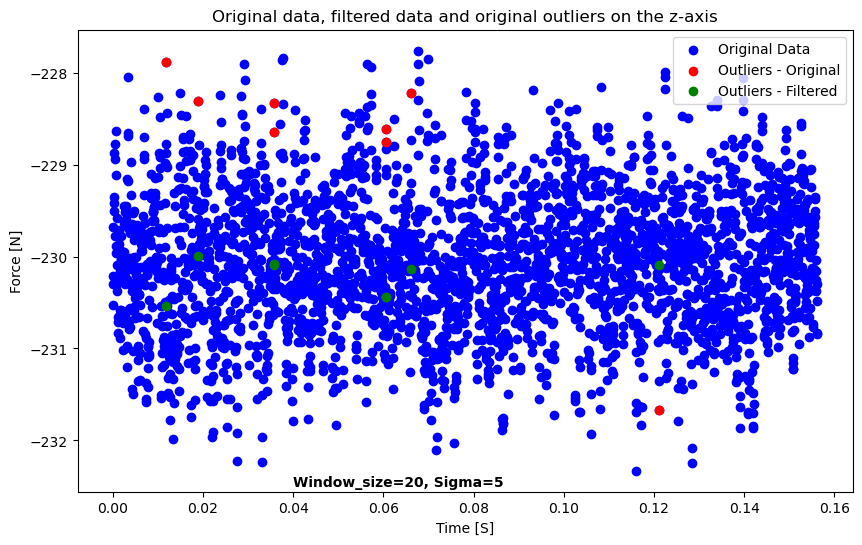

In [ ]:
# Plot the original data, filtered data and original outliers on the Z-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_z'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.04, -232.5, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

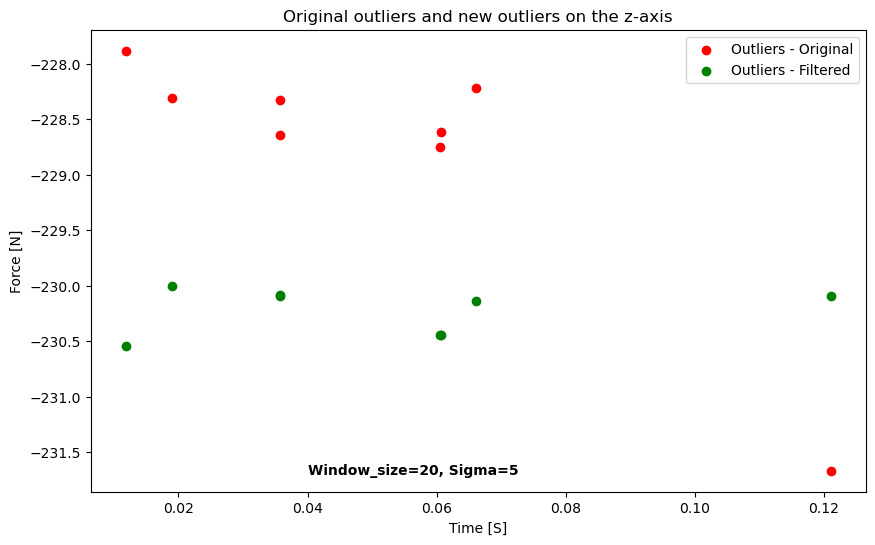

In [ ]:
# Scatter plot for original outliers and new outliers on the z-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.04, -231.7, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

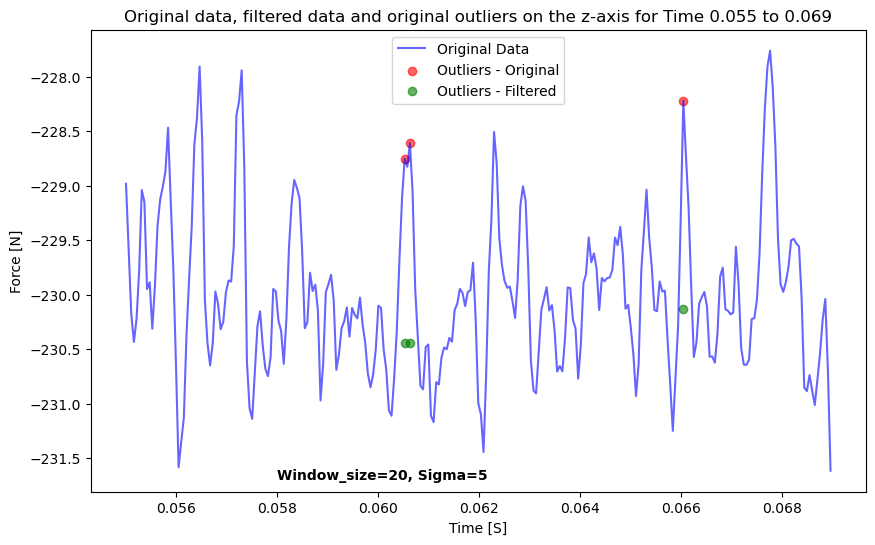

In [ ]:
# Filter dataframe for specified time range
subset_range = subset[(subset['Time'] >= 0.055) & (subset['Time'] <= 0.069)]

# Calculate outliers for new time range
outliers_time_range = [time for time in outliers_time if 0.055 <= time <= 0.069]
outliers_values_range = [value for time, value in zip(outliers_time, outliers_values) if 0.055 <= time <= 0.069]
new_values_range = [value for time, value in zip(outliers_time, new_values) if 0.055 <= time <= 0.069]

plt.figure(figsize=(10, 6))
plt.plot(subset_range['Time'], subset_range['F_z'], color='b', label='Original Data', alpha=0.6)
plt.scatter(outliers_time_range, outliers_values_range, color="r", label="Outliers - Original", alpha=0.6)
plt.scatter(outliers_time_range, new_values_range, color="g", label="Outliers - Filtered", alpha=0.6)
plt.title('Original data, filtered data and original outliers on the z-axis for Time 0.055 to 0.069')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.058, -231.7, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

### Applying the Hampel filter with setting window_size=40 and sigma=5

#### Hampel filter for X-axis with window_size=40 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_x"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=40, n_sigma=5)

In [ ]:
# Statistical summary for the original data on x-axis
df[['Time', 'F_x']][:3000].describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911108
std,0.045113,0.134965
min,0.000000,-7.384572
25%,0.039049,-7.002866
50%,0.078099,-6.916395
75%,0.117148,-6.818836
max,0.156198,-6.372138


In [ ]:
# Statistical summary for the filtered data with window_size=40 and n_sigma=5 on X-axis
filtered_data.describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911441
std,0.045113,0.133266
min,0.000000,-7.333333
25%,0.039049,-7.002830
50%,0.078099,-6.916690
75%,0.117148,-6.820207
max,0.156198,-6.421630


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_x']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_x)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_x']:
    original_value = subset.loc[index, 'F_x']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_x'] for index in outliers['F_x']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the X-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the X-axis:", len(new_values))

Number of original outliers on the X-axis: 9
Number of filtered outliers on the X-axis: 9


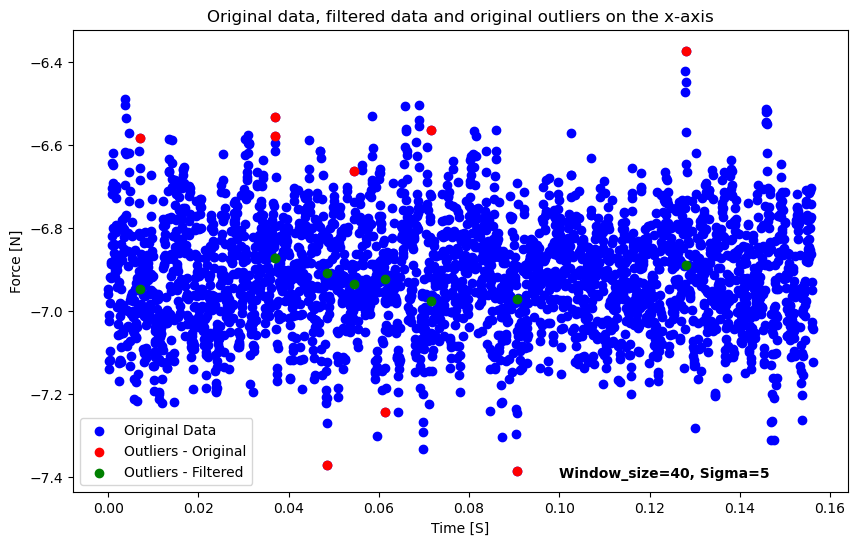

In [ ]:
# Plot the original data, filtered data and original outliers on the X-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_x'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.10, -7.4, "Window_size=40, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

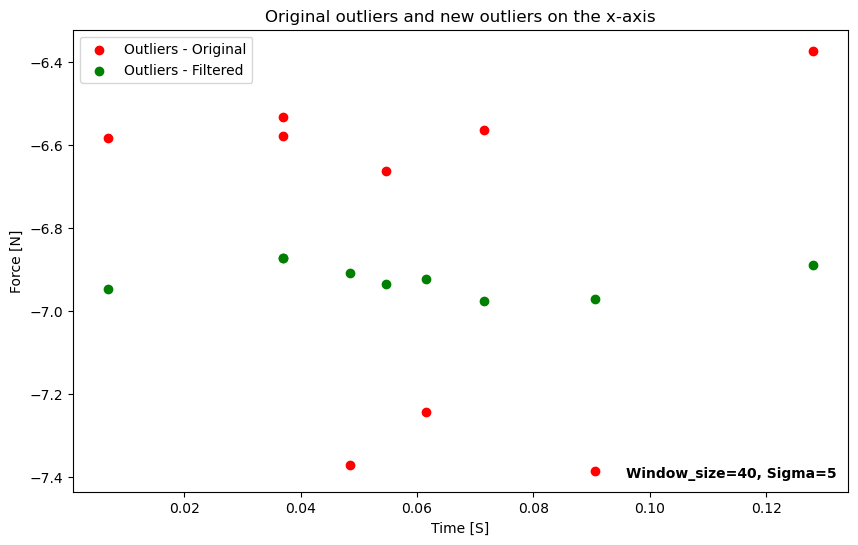

In [ ]:
# Scatter plot for original outliers and new outliers on the x-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.096, -7.4, "Window_size=40, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

#### Hampel filter for Y-axis with window_size=40 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_y"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=40, n_sigma=5)

In [ ]:
# Statistical summary for the original data on y-axis
df[['Time', 'F_y']][:3000].describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.152833
std,0.045113,0.127727
min,0.000000,3.756379
25%,0.039049,4.067976
50%,0.078099,4.152617
75%,0.117148,4.234664
max,0.156198,4.630175


In [ ]:
# Statistical summary for the filtered data with window_size=40 and n_sigma=5 on Y-axis
filtered_data.describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.152163
std,0.045113,0.124818
min,0.000000,3.757986
25%,0.039049,4.069579
50%,0.078099,4.152617
75%,0.117148,4.233533
max,0.156198,4.608654


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_y']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_y)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_y']:
    original_value = subset.loc[index, 'F_y']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_y'] for index in outliers['F_y']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Y-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Y-axis:", len(new_values))

Number of original outliers on the Y-axis: 23
Number of filtered outliers on the Y-axis: 23


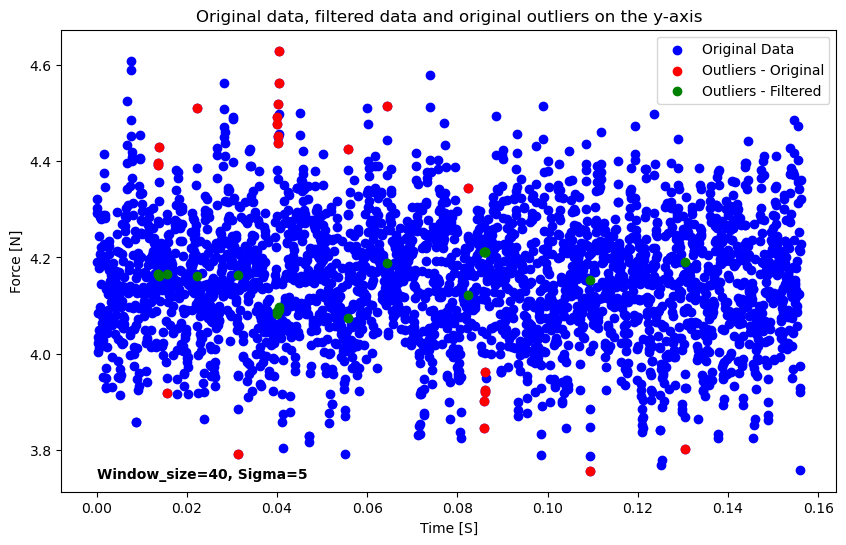

In [ ]:
# Plot the original data, filtered data and original outliers on the y-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_y'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.00, 3.74, "Window_size=40, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

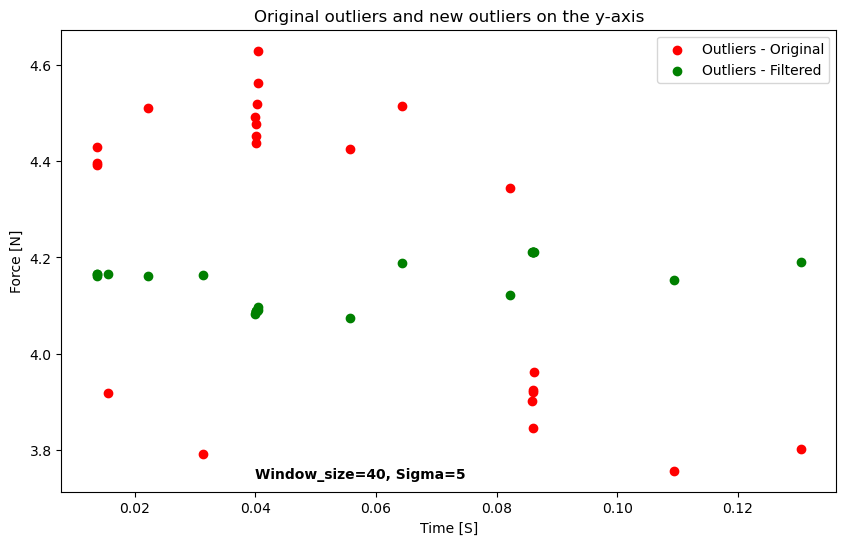

In [ ]:
# Scatter plot for original outliers and new outliers on the y-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.04, 3.74, "Window_size=40, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

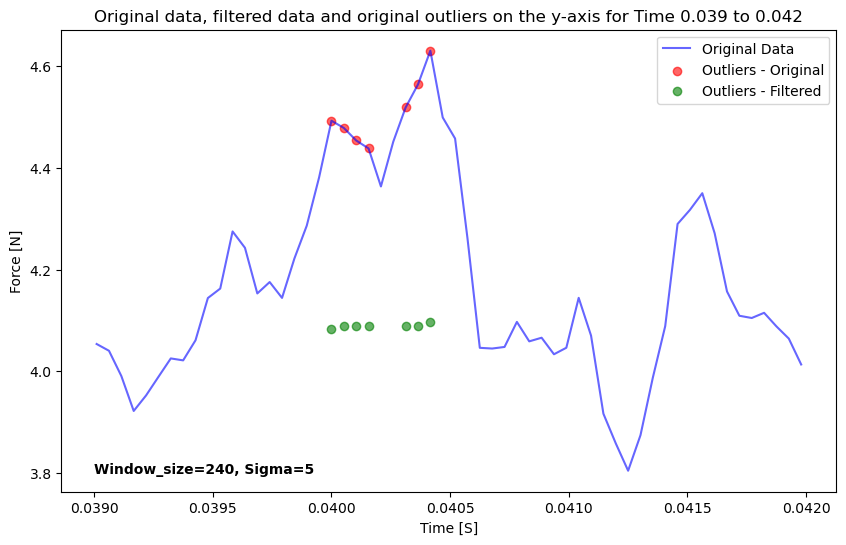

In [ ]:
# Filter dataframe for specified time range
subset_range = subset[(subset['Time'] >= 0.039) & (subset['Time'] <= 0.042)]

# Calculate outliers for new time range
outliers_time_range = [time for time in outliers_time if 0.039 <= time <= 0.042]
outliers_values_range = [value for time, value in zip(outliers_time, outliers_values) if 0.039 <= time <= 0.042]
new_values_range = [value for time, value in zip(outliers_time, new_values) if 0.039 <= time <= 0.042]

plt.figure(figsize=(10, 6))
plt.plot(subset_range['Time'], subset_range['F_y'], color='b', label='Original Data', alpha=0.6)
plt.scatter(outliers_time_range, outliers_values_range, color="r", label="Outliers - Original", alpha=0.6)
plt.scatter(outliers_time_range, new_values_range, color="g", label="Outliers - Filtered", alpha=0.6)
plt.title('Original data, filtered data and original outliers on the y-axis for Time 0.039 to 0.042')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.039, 3.8, "Window_size=240, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

#### Hampel filter for Z-axis with window_size=40 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_z"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=40, n_sigma=5)

In [ ]:
# Statistical summary for the original data on z-axis
df[['Time', 'F_z']][:3000].describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.063423
std,0.045113,0.737075
min,0.000000,-232.329361
25%,0.039049,-230.568504
50%,0.078099,-230.078430
75%,0.117148,-229.572449
max,0.156198,-227.761429


In [ ]:
# Statistical summary for the filtered data with window_size=40 and n_sigma=5 on Z-axis
filtered_data.describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.064705
std,0.045113,0.729952
min,0.000000,-232.329361
25%,0.039049,-230.566757
50%,0.078099,-230.079369
75%,0.117148,-229.574394
max,0.156198,-227.761429


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_z']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_z)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_z']:
    original_value = subset.loc[index, 'F_z']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_z'] for index in outliers['F_z']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Z-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Z-axis:", len(new_values))

Number of original outliers on the Z-axis: 8
Number of filtered outliers on the Z-axis: 8


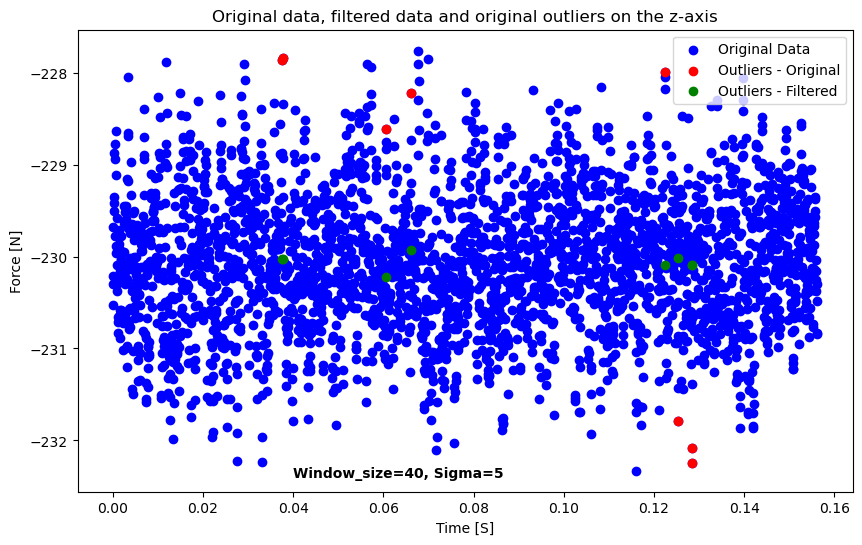

In [ ]:
# Plot the original data, filtered data and original outliers on the Z-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_z'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.04, -232.4, "Window_size=40, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

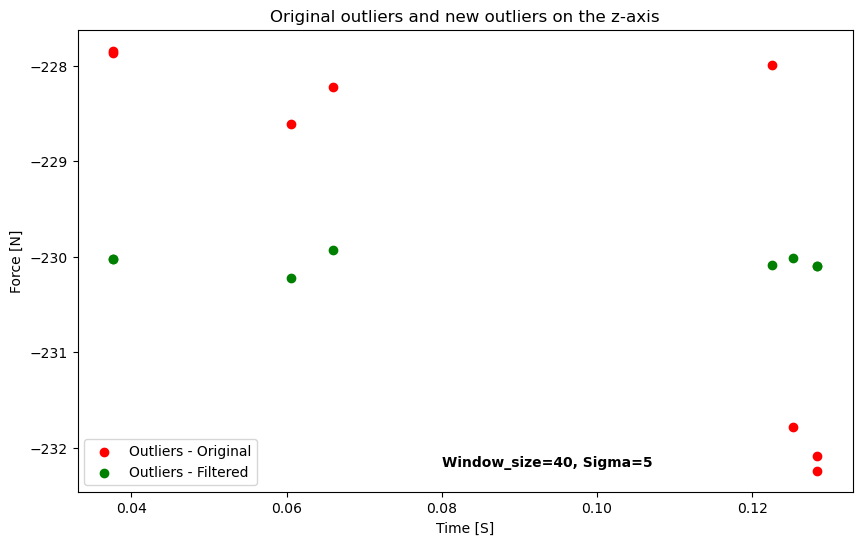

In [ ]:
# Scatter plot for original outliers and new outliers on the z-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.08, -232.2, "Window_size=40, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

### Applying the Hampel filter with setting window_size=80 and sigma=5

#### Hampel filter for X-axis with window_size=80 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_x"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=80, n_sigma=5)

In [ ]:
# Statistical summary for the original data on x-axis
df[['Time', 'F_x']][:3000].describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911108
std,0.045113,0.134965
min,0.000000,-7.384572
25%,0.039049,-7.002866
50%,0.078099,-6.916395
75%,0.117148,-6.818836
max,0.156198,-6.372138


In [ ]:
# Statistical summary for the filtered data with window_size=80 and n_sigma=5 on X-axis
filtered_data.describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911406
std,0.045113,0.133549
min,0.000000,-7.370342
25%,0.039049,-7.002838
50%,0.078099,-6.916690
75%,0.117148,-6.820118
max,0.156198,-6.447531


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_x']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_x)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_x']:
    original_value = subset.loc[index, 'F_x']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_x'] for index in outliers['F_x']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the X-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the X-axis:", len(new_values))

Number of original outliers on the X-axis: 6
Number of filtered outliers on the X-axis: 6


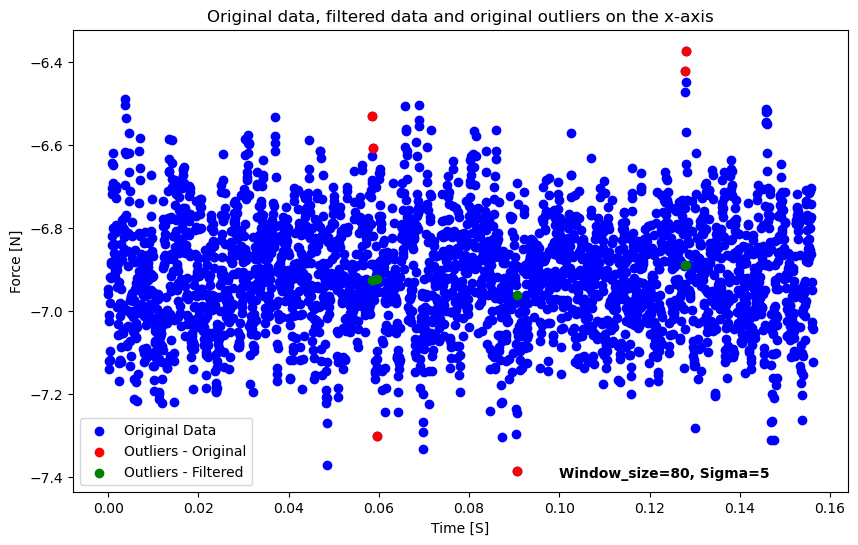

In [ ]:
# Plot the original data, filtered data and original outliers on the X-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_x'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.10, -7.4, "Window_size=80, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

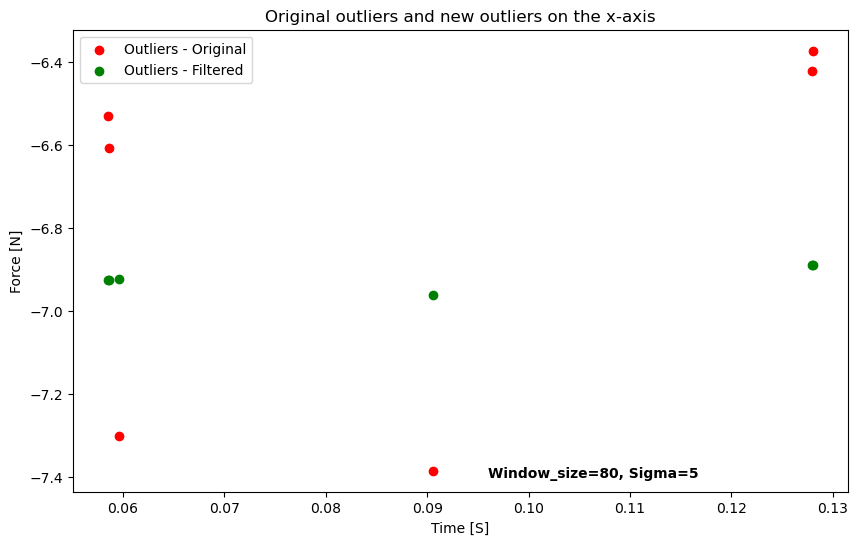

In [ ]:
# Scatter plot for original outliers and new outliers on the x-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.096, -7.4, "Window_size=80, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

#### Hampel filter for Y-axis with window_size=80 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_y"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=40, n_sigma=5)

In [ ]:
# Statistical summary for the original data on y-axis
df[['Time', 'F_y']][:3000].describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.152833
std,0.045113,0.127727
min,0.000000,3.756379
25%,0.039049,4.067976
50%,0.078099,4.152617
75%,0.117148,4.234664
max,0.156198,4.630175


In [ ]:
# Statistical summary for the filtered data with window_size=80 and n_sigma=5 on Y-axis
filtered_data.describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.152163
std,0.045113,0.124818
min,0.000000,3.757986
25%,0.039049,4.069579
50%,0.078099,4.152617
75%,0.117148,4.233533
max,0.156198,4.608654


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_y']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_y)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_y']:
    original_value = subset.loc[index, 'F_y']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_y'] for index in outliers['F_y']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Y-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Y-axis:", len(new_values))

Number of original outliers on the Y-axis: 23
Number of filtered outliers on the Y-axis: 23


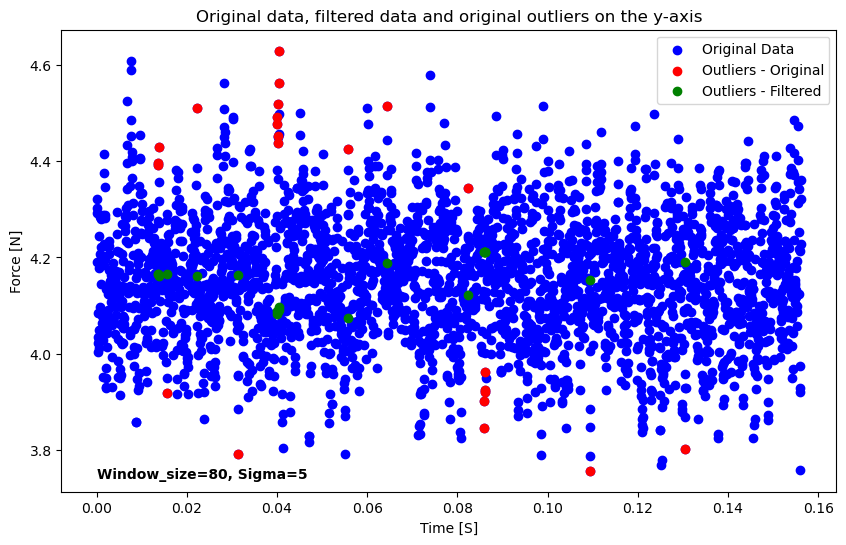

In [ ]:
# Plot the original data, filtered data and original outliers on the Y-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_y'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.00, 3.74, "Window_size=80, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

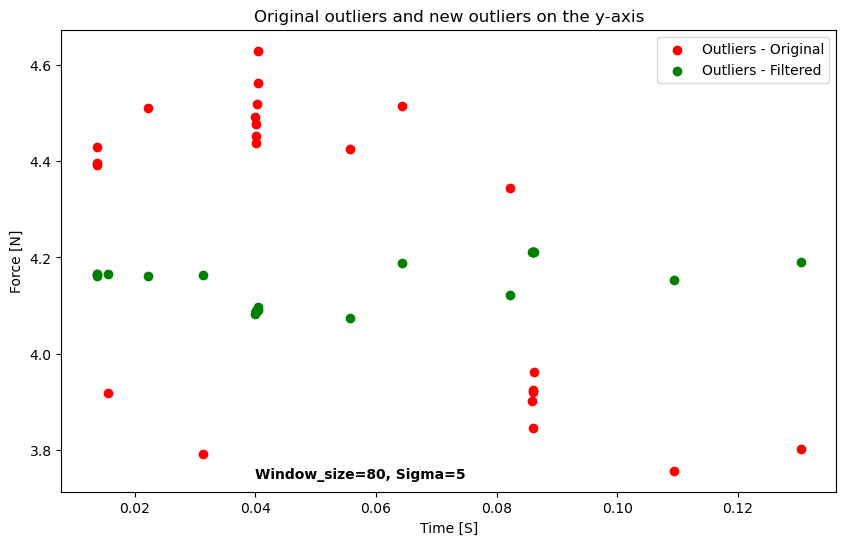

In [ ]:
# Scatter plot for original outliers and new outliers on the y-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.04, 3.74, "Window_size=80, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

#### Hampel filter for Z-axis with window_size=80 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_z"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=80, n_sigma=5)

In [ ]:
# Statistical summary for the original data on z-axis
df[['Time', 'F_z']][:3000].describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.063423
std,0.045113,0.737075
min,0.000000,-232.329361
25%,0.039049,-230.568504
50%,0.078099,-230.078430
75%,0.117148,-229.572449
max,0.156198,-227.761429


In [ ]:
# Statistical summary for the filtered data with window_size=80 and n_sigma=5 on Z-axis
filtered_data.describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.063468
std,0.045113,0.732555
min,0.000000,-232.240997
25%,0.039049,-230.567368
50%,0.078099,-230.078430
75%,0.117148,-229.573940
max,0.156198,-227.842224


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_z']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_z)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_z']:
    original_value = subset.loc[index, 'F_z']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_z'] for index in outliers['F_z']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Z-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Z-axis:", len(new_values))

Number of original outliers on the Z-axis: 4
Number of filtered outliers on the Z-axis: 4


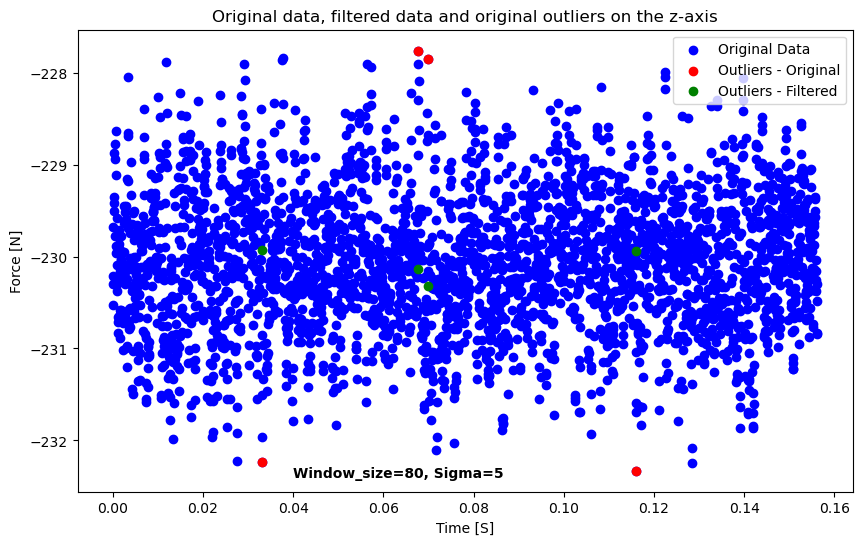

In [ ]:
# Plot the original data, filtered data and original outliers on the Z-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_z'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.04, -232.4, "Window_size=80, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

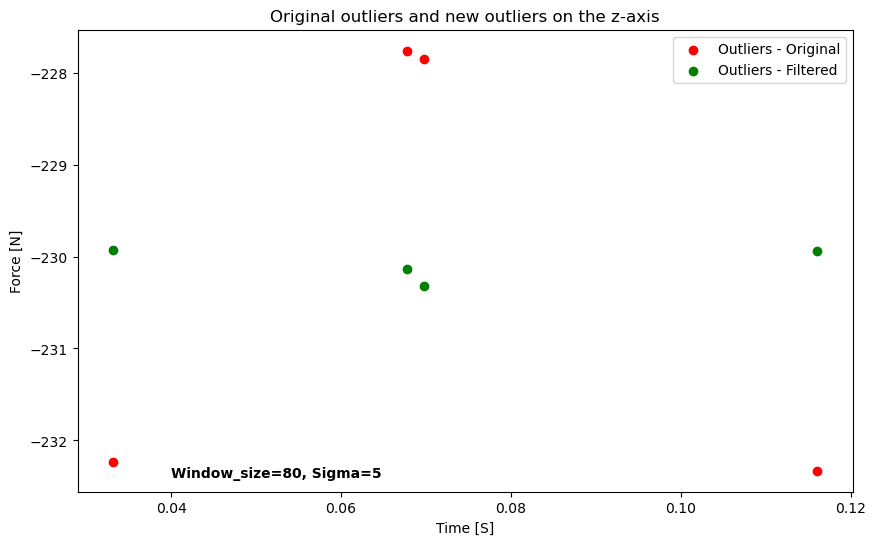

In [ ]:
# Scatter plot for original outliers and new outliers on the Z-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.04, -232.4, "Window_size=80, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

### Applying the Hampel filter with setting window_size=100 and sigma=5

#### Hampel filter for X-axis with window_size=100 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_x"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=100, n_sigma=5)

In [ ]:
# Statistical summary for the original data on x-axis
df[['Time', 'F_x']][:3000].describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911108
std,0.045113,0.134965
min,0.000000,-7.384572
25%,0.039049,-7.002866
50%,0.078099,-6.916395
75%,0.117148,-6.818836
max,0.156198,-6.372138


In [ ]:
# Statistical summary for the filtered data with window_size=100 and n_sigma=5 on X-axis
filtered_data.describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911396
std,0.045113,0.133549
min,0.000000,-7.370342
25%,0.039049,-7.002838
50%,0.078099,-6.916690
75%,0.117148,-6.820118
max,0.156198,-6.447531


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_x']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_x)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_x']:
    original_value = subset.loc[index, 'F_x']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)
5
# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_x'] for index in outliers['F_x']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the X-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the X-axis:", len(new_values))

Number of original outliers on the X-axis: 6
Number of filtered outliers on the X-axis: 6


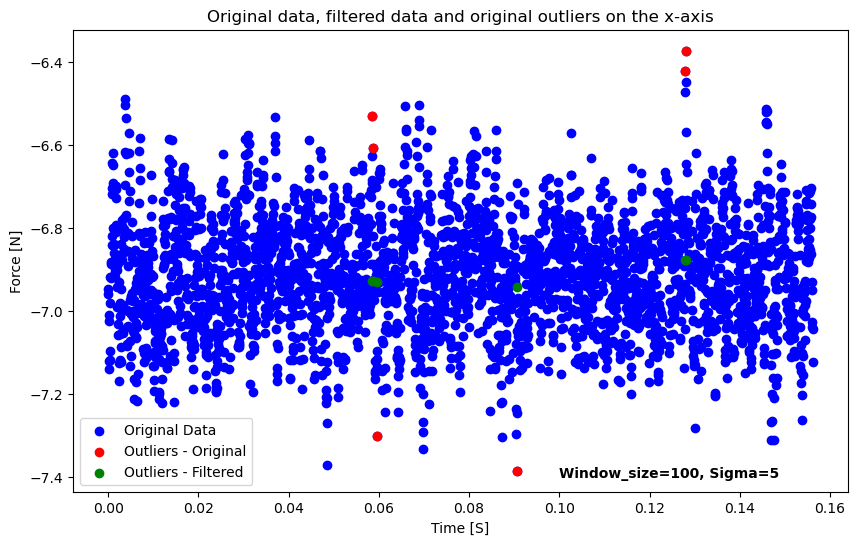

In [ ]:
# Plot the original data, filtered data and original outliers on the X-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_x'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.10, -7.4, "Window_size=100, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

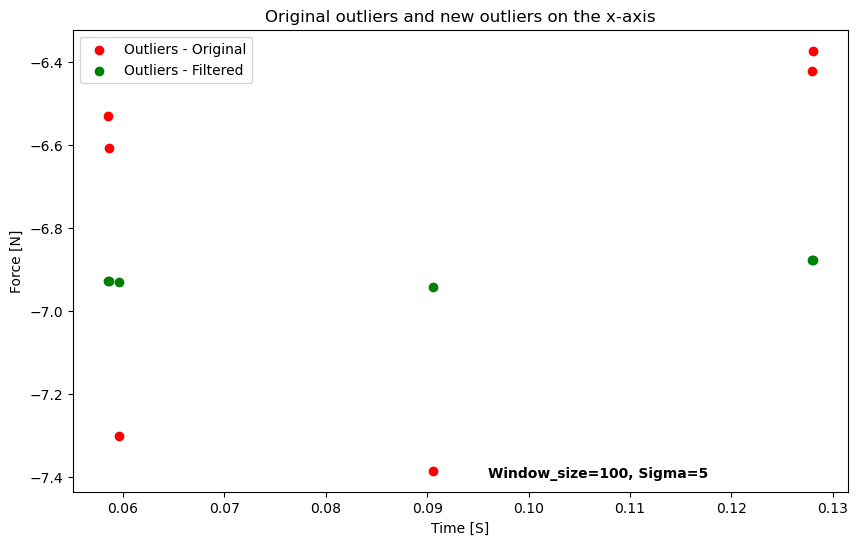

In [ ]:
# Scatter plot for original outliers and new outliers on the x-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.096, -7.4, "Window_size=100, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

#### Hampel filter for Y-axis with window_size=100 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_y"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=100, n_sigma=5)

In [ ]:
# Statistical summary for the original data on y-axis
df[['Time', 'F_y']][:3000].describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.152833
std,0.045113,0.127727
min,0.000000,3.756379
25%,0.039049,4.067976
50%,0.078099,4.152617
75%,0.117148,4.234664
max,0.156198,4.630175


In [ ]:
# Statistical summary for the filtered data with window_size=100 and n_sigma=5 on Y-axis
filtered_data.describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.152748
std,0.045113,0.125622
min,0.000000,3.769037
25%,0.039049,4.068812
50%,0.078099,4.152699
75%,0.117148,4.234347
max,0.156198,4.578863


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_y']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_y)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_y']:
    original_value = subset.loc[index, 'F_y']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_y'] for index in outliers['F_y']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Y-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Y-axis:", len(new_values))

Number of original outliers on the Y-axis: 10
Number of filtered outliers on the Y-axis: 10


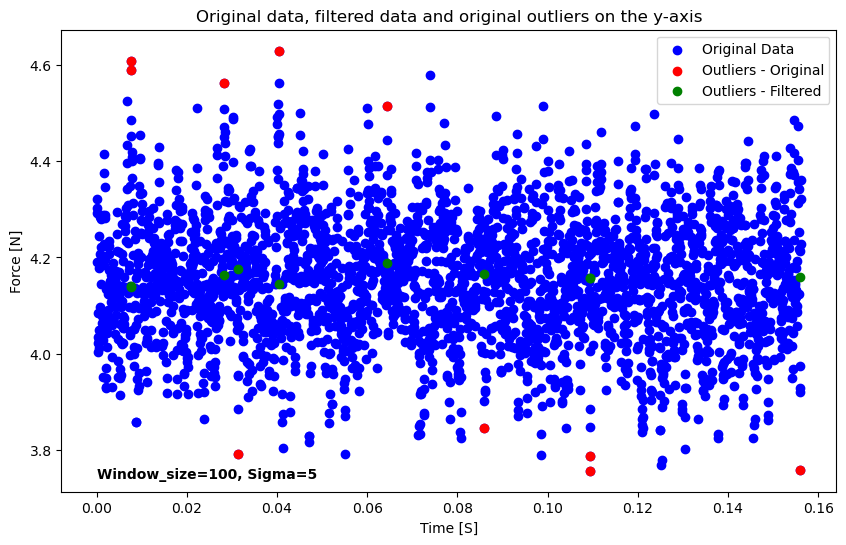

In [ ]:
# Plot the original data, filtered data and original outliers on the Y-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_y'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.00, 3.74, "Window_size=100, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

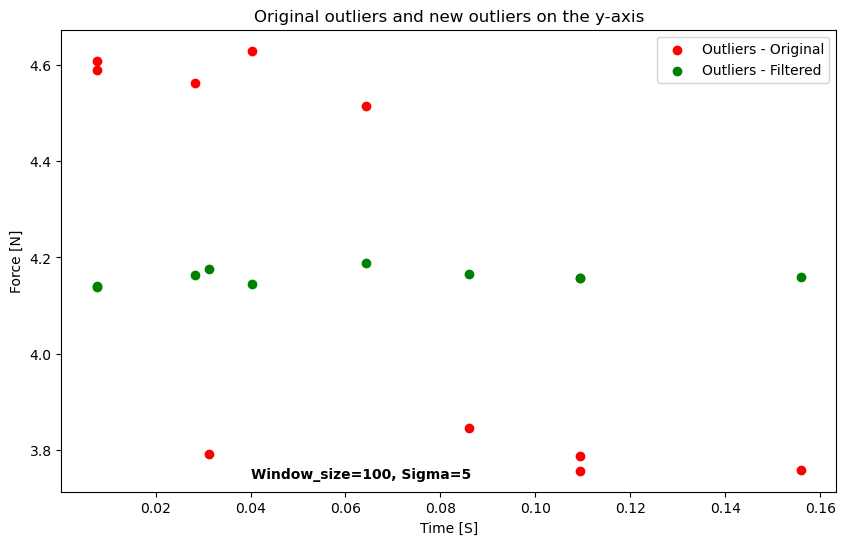

In [ ]:
# Scatter plot for original outliers and new outliers on the y-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.04, 3.74, "Window_size=100, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

#### Hampel filter for Z-axis with window_size=100 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_z"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=100, n_sigma=5)

In [ ]:
# Statistical summary for the original data on z-axis
df[['Time', 'F_z']][:3000].describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.063423
std,0.045113,0.737075
min,0.000000,-232.329361
25%,0.039049,-230.568504
50%,0.078099,-230.078430
75%,0.117148,-229.572449
max,0.156198,-227.761429


In [ ]:
# Statistical summary for the filtered data with window_size=100 and n_sigma=5 on Z-axis
filtered_data.describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.063443
std,0.045113,0.732583
min,0.000000,-232.236145
25%,0.039049,-230.567368
50%,0.078099,-230.078430
75%,0.117148,-229.573940
max,0.156198,-227.842224


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_z']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_z)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_z']:
    original_value = subset.loc[index, 'F_z']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_z'] for index in outliers['F_z']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Z-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Z-axis:", len(new_values))

Number of original outliers on the Z-axis: 4
Number of filtered outliers on the Z-axis: 4


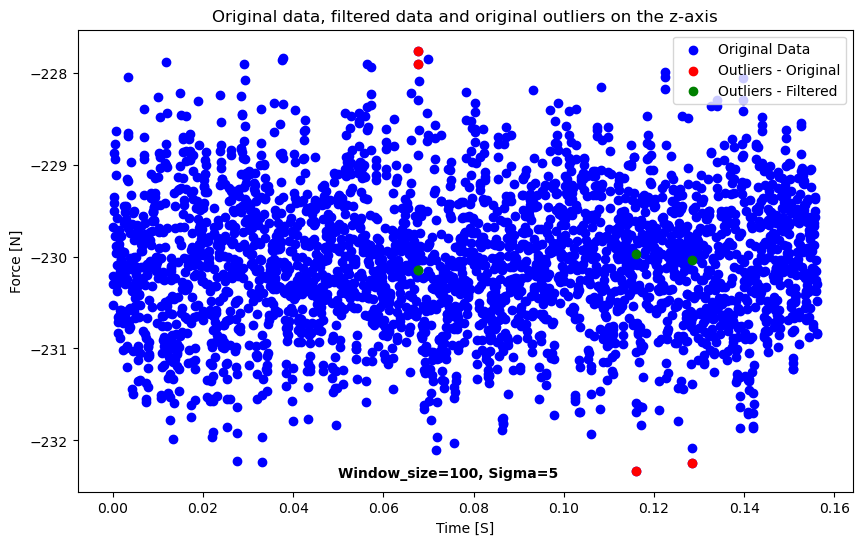

In [ ]:
# Plot the original data, filtered data and original outliers on the Z-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_z'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.05, -232.4, "Window_size=100, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

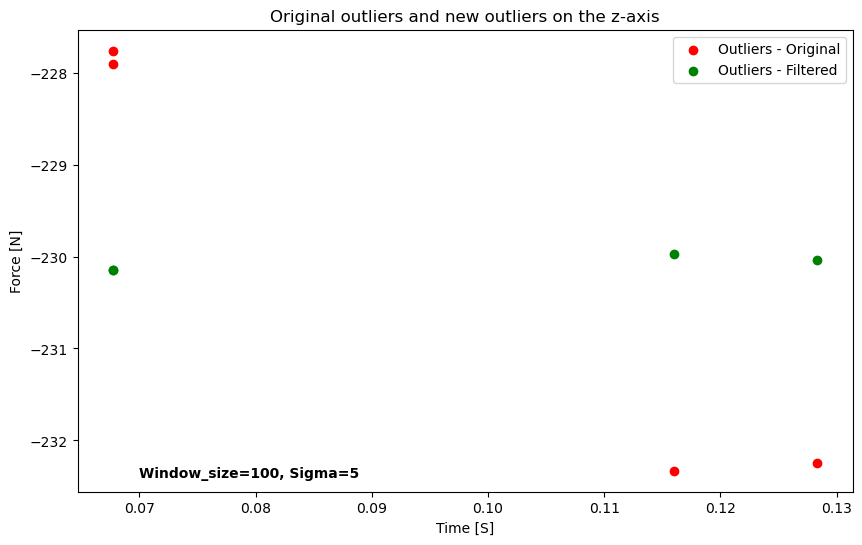

In [ ]:
# Scatter plot for original outliers and new outliers on the z-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.07, -232.4, "Window_size=100, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

### Applying the Hampel filter with setting window_size=140 and sigma=5

#### Hampel filter for X-axis with window_size=140 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_x"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=140, n_sigma=5)

In [ ]:
# Statistical summary for the original data on x-axis
df[['Time', 'F_x']][:3000].describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911108
std,0.045113,0.134965
min,0.000000,-7.384572
25%,0.039049,-7.002866
50%,0.078099,-6.916395
75%,0.117148,-6.818836
max,0.156198,-6.372138


In [ ]:
# Statistical summary for the filtered data with window_size=140 and n_sigma=5 on X-axis
filtered_data.describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911264
std,0.045113,0.133587
min,0.000000,-7.333333
25%,0.039049,-7.002838
50%,0.078099,-6.916543
75%,0.117148,-6.819926
max,0.156198,-6.447531


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_x']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_x)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_x']:
    original_value = subset.loc[index, 'F_x']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_x'] for index in outliers['F_x']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the X-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the X-axis:", len(new_values))

Number of original outliers on the X-axis: 5
Number of filtered outliers on the X-axis: 5


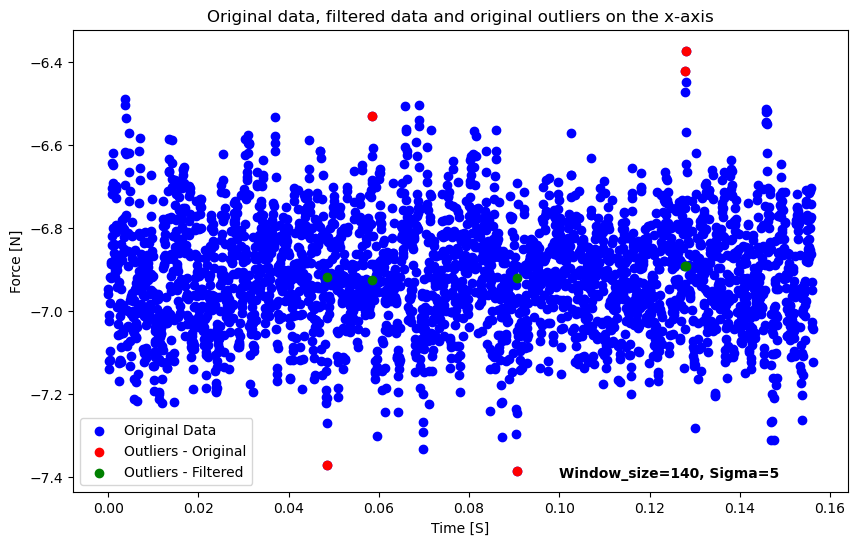

In [ ]:
# Plot the original data, filtered data and original outliers on the X-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_x'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.10, -7.4, "Window_size=140, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

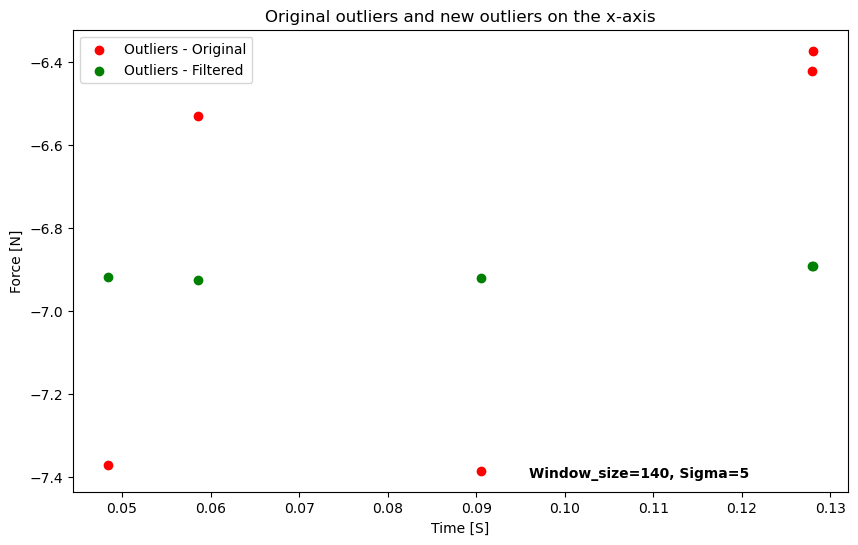

In [ ]:
# Scatter plot for original outliers and new outliers on the x-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.096, -7.4, "Window_size=140, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

#### Hampel filter for Y-axis with window_size=140 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_y"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=140, n_sigma=5)

In [ ]:
# Statistical summary for the original data on y-axis
df[['Time', 'F_y']][:3000].describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.152833
std,0.045113,0.127727
min,0.000000,3.756379
25%,0.039049,4.067976
50%,0.078099,4.152617
75%,0.117148,4.234664
max,0.156198,4.630175


In [ ]:
# Statistical summary for the filtered data with window_size=140 and n_sigma=5 on Y-axis
filtered_data.describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.152793
std,0.045113,0.126395
min,0.000000,3.769037
25%,0.039049,4.068447
50%,0.078099,4.152650
75%,0.117148,4.234494
max,0.156198,4.630175


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_y']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_y)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_y']:
    original_value = subset.loc[index, 'F_y']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_y'] for index in outliers['F_y']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Y-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Y-axis:", len(new_values))

Number of original outliers on the Y-axis: 6
Number of filtered outliers on the Y-axis: 6


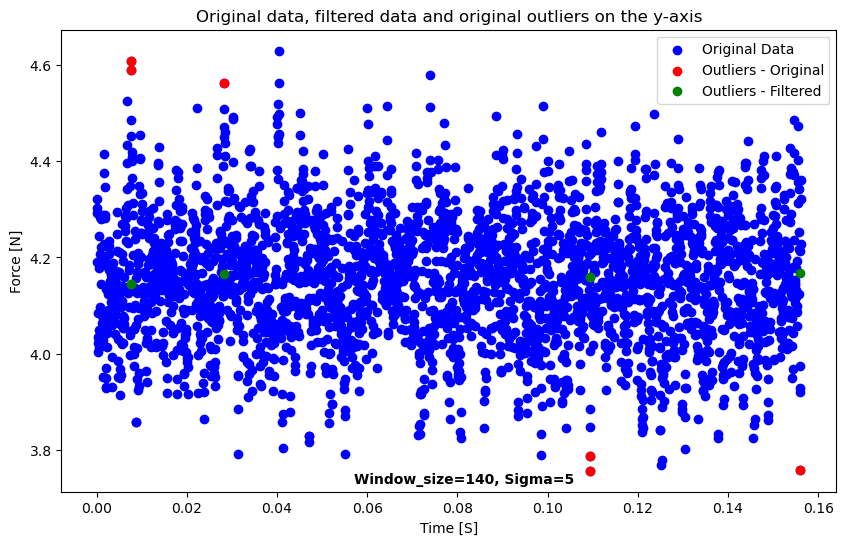

In [ ]:
# Plot the original data, filtered data and original outliers on the Y-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_y'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.057, 3.73, "Window_size=140, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

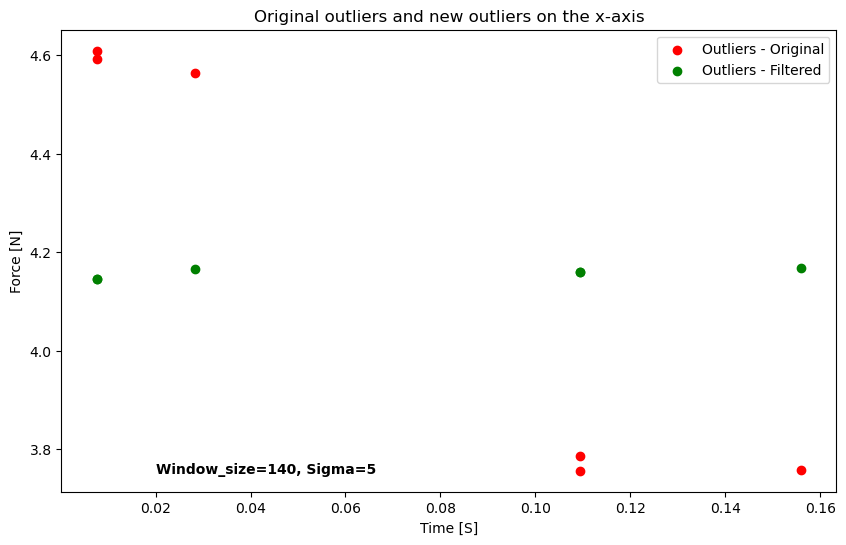

In [ ]:
# Scatter plot for original outliers and new outliers on the x-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.02, 3.75, "Window_size=140, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

#### Hampel filter for Z-axis with window_size=140 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_z"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=140, n_sigma=5)

In [ ]:
# Statistical summary for the original data on z-axis
df[['Time', 'F_z']][:3000].describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.063423
std,0.045113,0.737075
min,0.000000,-232.329361
25%,0.039049,-230.568504
50%,0.078099,-230.078430
75%,0.117148,-229.572449
max,0.156198,-227.761429


In [ ]:
# Statistical summary for the filtered data with window_size=140 and n_sigma=5 on Z-axis
filtered_data.describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.064993
std,0.045113,0.732556
min,0.000000,-232.240997
25%,0.039049,-230.567924
50%,0.078099,-230.080040
75%,0.117148,-229.574196
max,0.156198,-227.842224


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_z']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_z)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_z']:
    original_value = subset.loc[index, 'F_z']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_z'] for index in outliers['F_z']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Z-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Z-axis:", len(new_values))

Number of original outliers on the Z-axis: 4
Number of filtered outliers on the Z-axis: 4


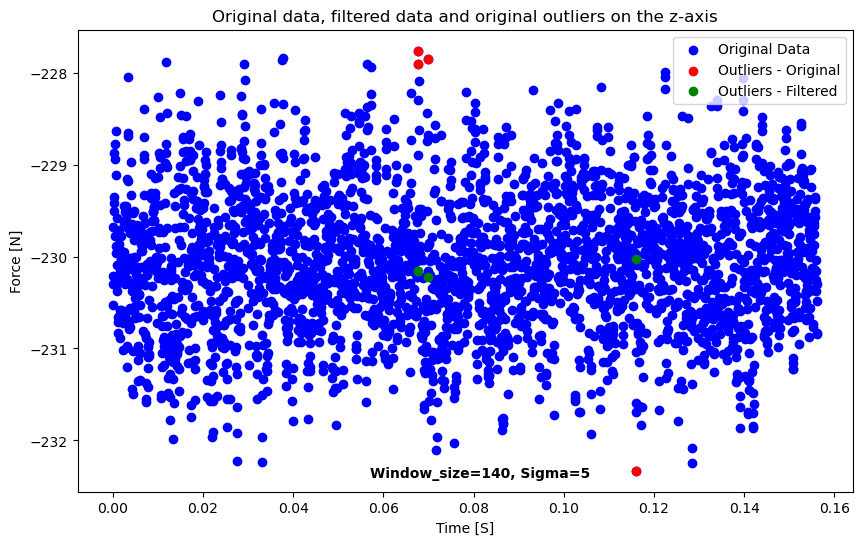

In [ ]:
# Plot the original data, filtered data and original outliers on the Z-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_z'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.057, -232.4, "Window_size=140, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

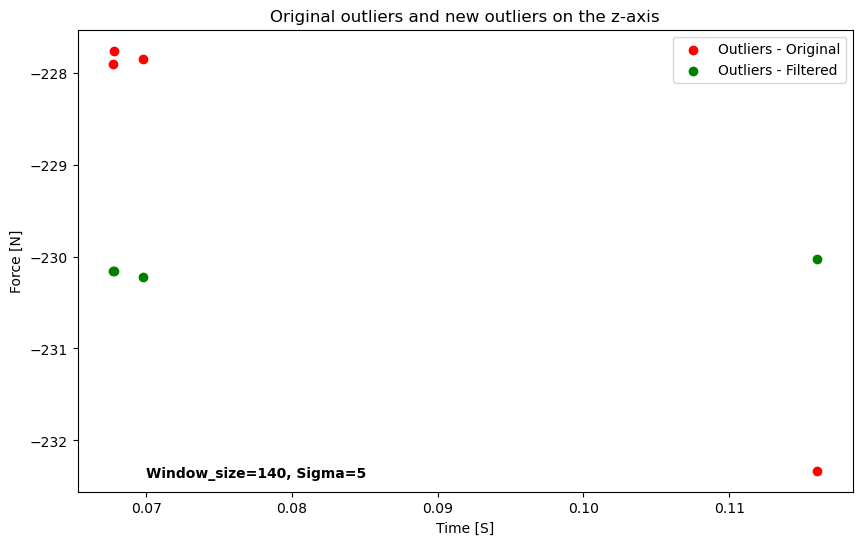

In [ ]:
# Scatter plot for original outliers and new outliers on the Z-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.07, -232.4, "Window_size=140, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

### Applying the Hampel filter with setting window_size=150 and sigma=5

#### Hampel filter for X-axis with window_size=150 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_x"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=150, n_sigma=5)

In [ ]:
# Statistical summary for the original data on x-axis
df[['Time', 'F_x']][:3000].describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911108
std,0.045113,0.134965
min,0.000000,-7.384572
25%,0.039049,-7.002866
50%,0.078099,-6.916395
75%,0.117148,-6.818836
max,0.156198,-6.372138


In [ ]:
# Statistical summary for the filtered data with window_size=150 and n_sigma=5 on X-axis
filtered_data.describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911166
std,0.045113,0.133361
min,0.000000,-7.333333
25%,0.039049,-7.002830
50%,0.078099,-6.916543
75%,0.117148,-6.819926
max,0.156198,-6.447531


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_x']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_x)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_x']:
    original_value = subset.loc[index, 'F_x']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_x'] for index in outliers['F_x']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the X-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the X-axis:", len(new_values))

Number of original outliers on the X-axis: 6
Number of filtered outliers on the X-axis: 6


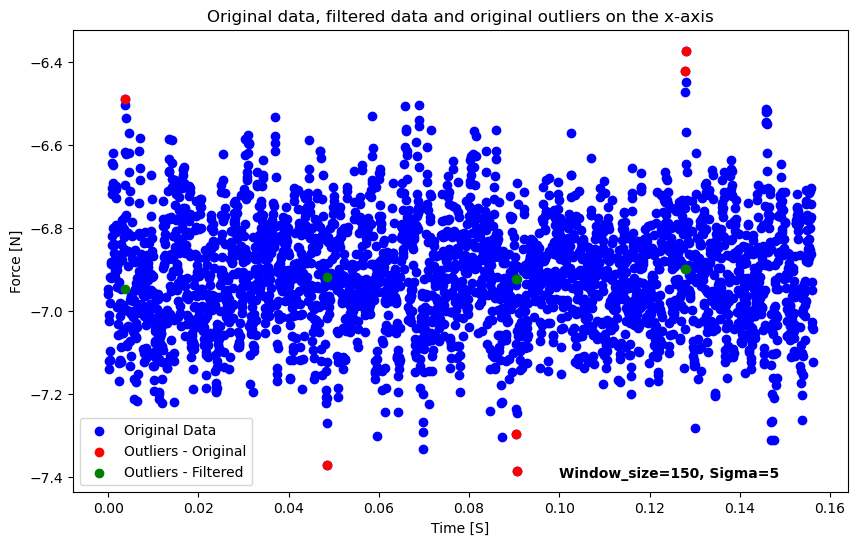

In [ ]:
# Plot the original data, filtered data and original outliers on the X-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_x'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.10, -7.4, "Window_size=150, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

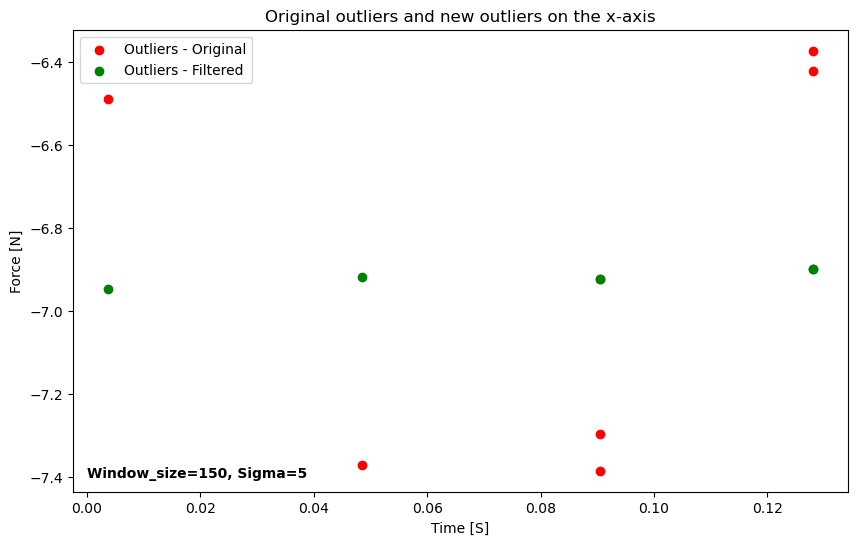

In [ ]:
# Scatter plot for original outliers and new outliers on the x-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.00, -7.4, "Window_size=150, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

#### Hampel filter for Y-axis with window_size=150 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_y"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=150, n_sigma=5)

In [ ]:
# Statistical summary for the original data on y-axis
df[['Time', 'F_y']][:3000].describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.152833
std,0.045113,0.127727
min,0.000000,3.756379
25%,0.039049,4.067976
50%,0.078099,4.152617
75%,0.117148,4.234664
max,0.156198,4.630175


In [ ]:
# Statistical summary for the filtered data with window_size=150 and n_sigma=5 on Y-axis
filtered_data.describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.152387
std,0.045113,0.126101
min,0.000000,3.769037
25%,0.039049,4.068408
50%,0.078099,4.152106
75%,0.117148,4.234347
max,0.156198,4.578863


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_y']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_y)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_y']:
    original_value = subset.loc[index, 'F_y']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_y'] for index in outliers['F_y']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Y-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Y-axis:", len(new_values))

Number of original outliers on the Y-axis: 7
Number of filtered outliers on the Y-axis: 7


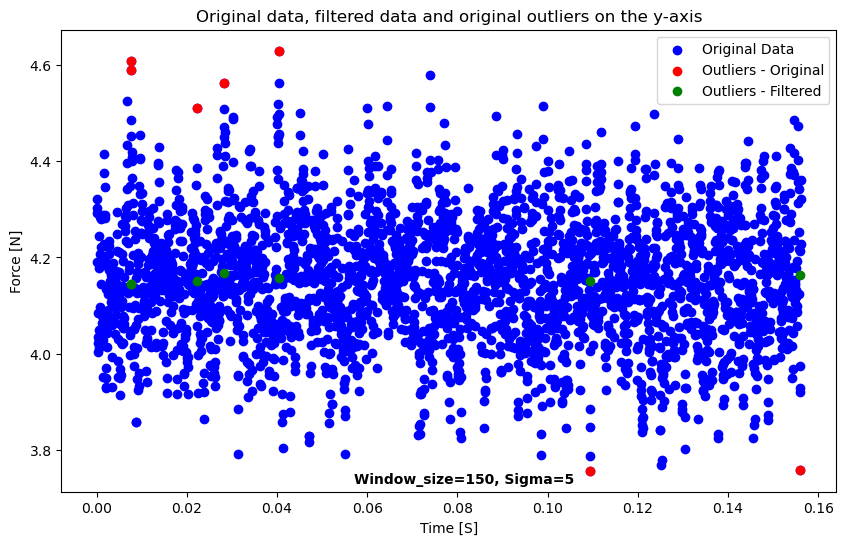

In [ ]:
# Plot the original data, filtered data and original outliers on the Y-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_y'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.0570, 3.73, "Window_size=150, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

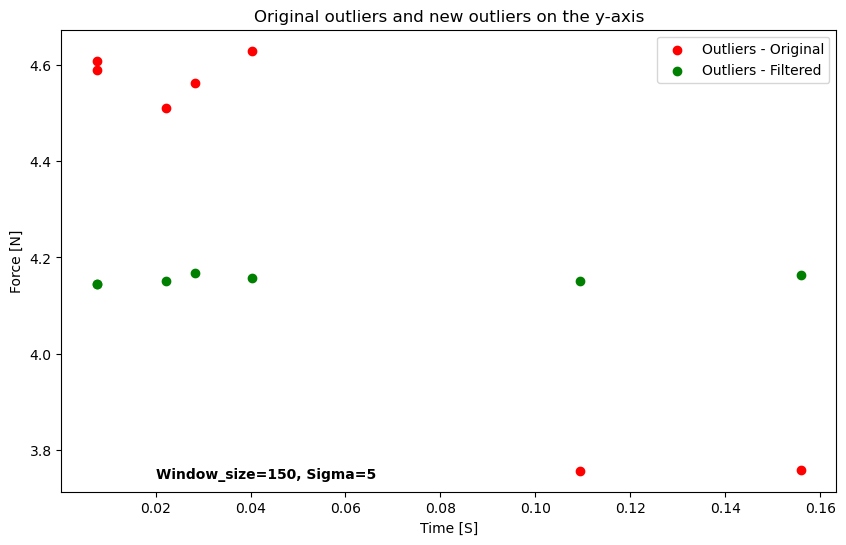

In [ ]:
# Scatter plot for original outliers and new outliers on the y-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.02, 3.74, "Window_size=150, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

#### Hampel filter for Z-axis with window_size=150 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_z"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=150, n_sigma=5)

In [ ]:
# Statistical summary for the original data on z-axis
df[['Time', 'F_z']][:3000].describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.063423
std,0.045113,0.737075
min,0.000000,-232.329361
25%,0.039049,-230.568504
50%,0.078099,-230.078430
75%,0.117148,-229.572449
max,0.156198,-227.761429


In [ ]:
# Statistical summary for the filtered data with window_size=150 and n_sigma=5 on Z-axis
filtered_data.describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.065012
std,0.045113,0.732559
min,0.000000,-232.240997
25%,0.039049,-230.567924
50%,0.078099,-230.080040
75%,0.117148,-229.574196
max,0.156198,-227.842224


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_z']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_z)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_z']:
    original_value = subset.loc[index, 'F_z']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_z'] for index in outliers['F_z']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Z-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Z-axis:", len(new_values))

Number of original outliers on the Z-axis: 4
Number of filtered outliers on the Z-axis: 4


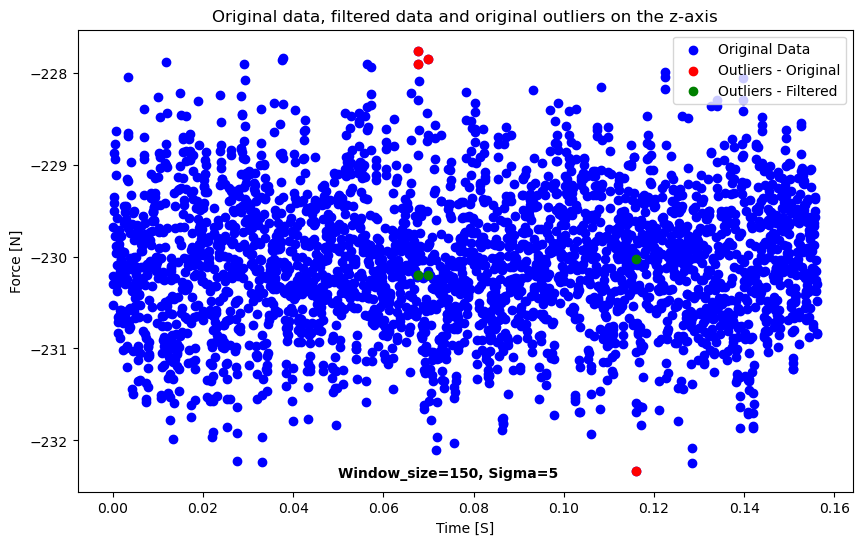

In [ ]:
# Plot the original data, filtered data and original outliers on the Z-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_z'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.05, -232.4, "Window_size=150, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

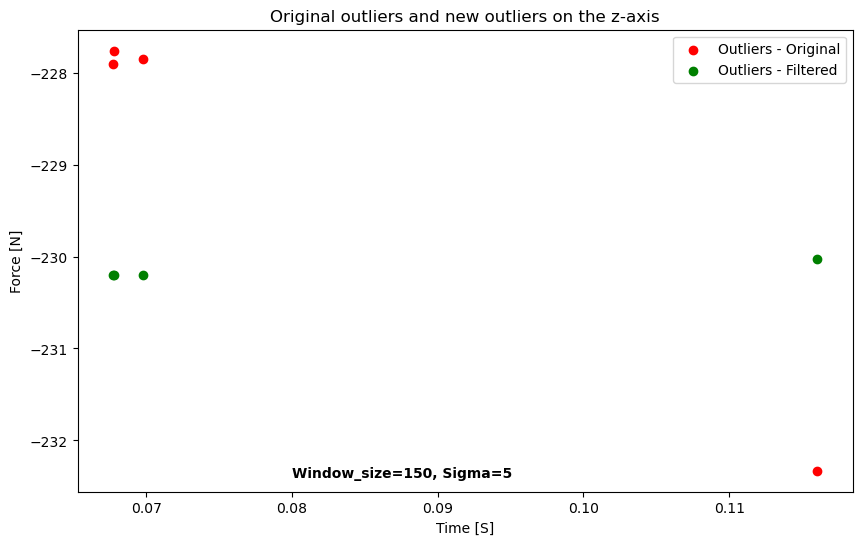

In [ ]:
# Scatter plot for original outliers and new outliers on the z-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.08, -232.4, "Window_size=150, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

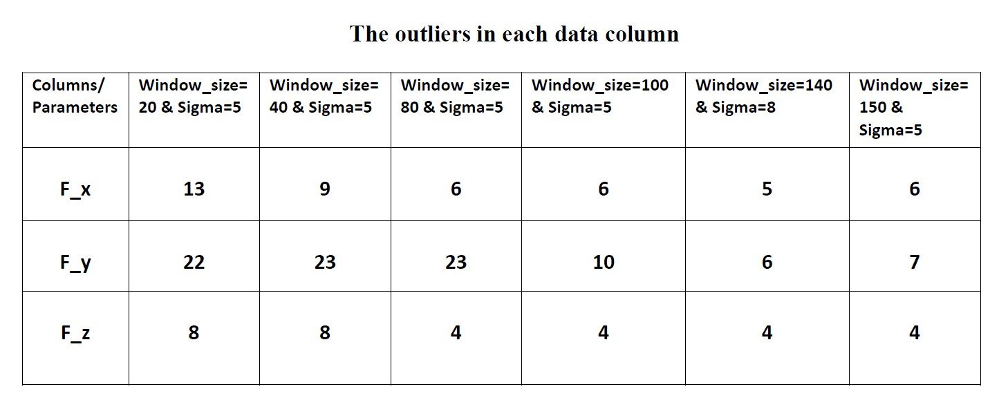

In [ ]:
#The numbers of outliers per columns
image_path = 'N-Outliers.jpg'
Image(filename=image_path)

### Applying the Hampel filter with setting window_size and sigma to 3

#### Hampel filter for X-axis with window_size=3 & sigma=3

In [ ]:
# Subset the dataframe
subset = df[["Time","F_x"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=3, n_sigma=3)


In [ ]:
# Statistical summary for the original data on X-axis
df[['Time', 'F_x']][:3000].describe()


,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911108
std,0.045113,0.134965
min,0.000000,-7.384572
25%,0.039049,-7.002866
50%,0.078099,-6.916395
75%,0.117148,-6.818836
max,0.156198,-6.372138


In [ ]:
# Statistical summary for the filtered data with window_size=3 and n_sigma=3 on X-axis
filtered_data.describe()


,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.910573
std,0.045113,0.132396
min,0.000000,-7.384572
25%,0.039049,-6.999454
50%,0.078099,-6.917248
75%,0.117148,-6.820146
max,0.156198,-6.372138


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_x']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_x)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_x']:
    original_value = subset.loc[index, 'F_x']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_x'] for index in outliers['F_x']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the X-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the X-axis:", len(new_values))


Number of original outliers on the X-axis: 120
Number of filtered outliers on the X-axis: 120


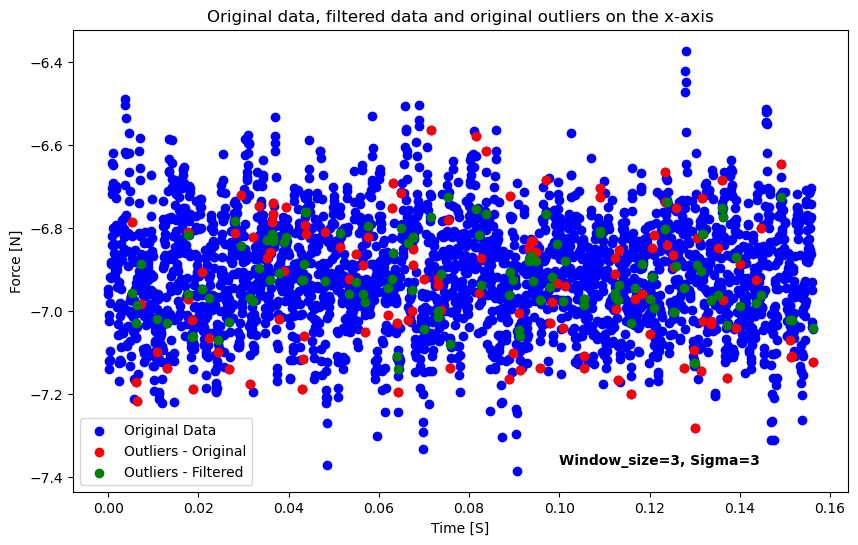

In [ ]:
# Plot the original data, filtered data and original outliers on the X-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_x'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.10, -7.37, "Window_size=3, Sigma=3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()


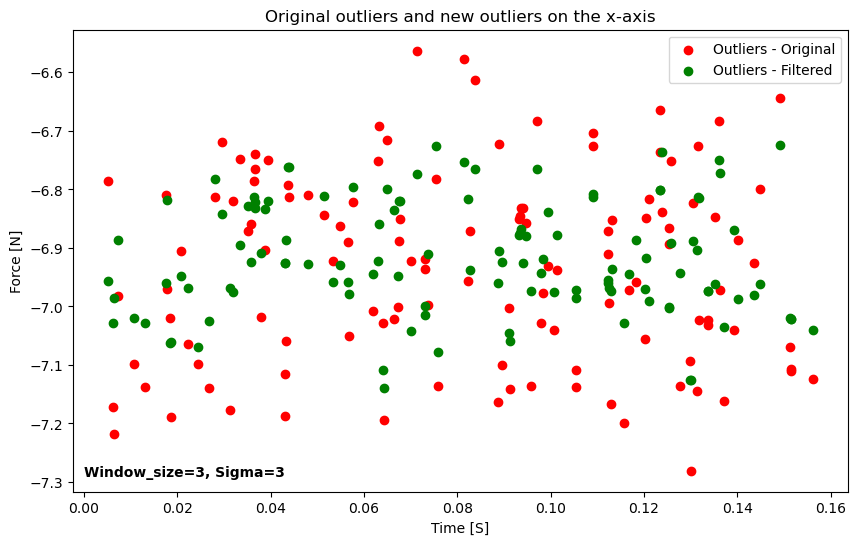

In [ ]:
# Scatter plot for original outliers and new outliers on the x-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.00, -7.29, "Window_size=3, Sigma=3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()


In [ ]:
# Using Square Root Rule to estimate the number of bins for the original data
num_bins_x = int(np.sqrt(len(df["F_x"][:3000])))
num_bins_y = int(np.sqrt(len(df["F_y"][:3000])))
num_bins_z = int(np.sqrt(len(df["F_z"][:3000])))

print(num_bins_x, num_bins_y, num_bins_z)

54 54 54


In [ ]:
# Using Square Root Rule to estimate the number of bins in X-axis for the filtered data
num_bins_f_x = int(np.sqrt(len(filtered_data["F_x"][:3000])))
print(num_bins_f_x)

54


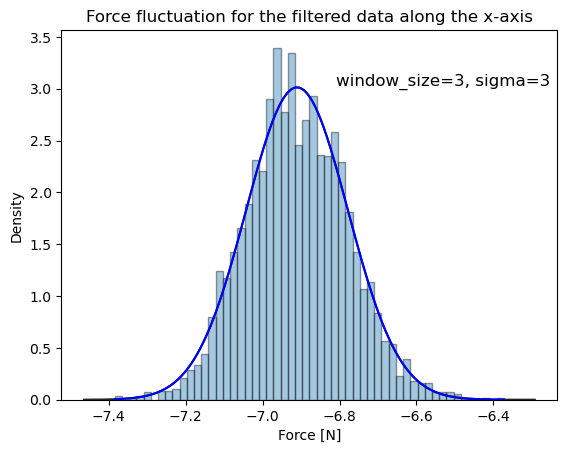

In [ ]:
# Filtered Data distribution at X-axis with window_size=3 and n_sigma=3

data = filtered_data['F_x'][:3000]
# Filter out non-finite values
data = data[np.isfinite(data)]
# Plot the histogram
sns.distplot(data, bins=54, fit=norm, kde=False, hist_kws={"edgecolor": "black"})
# Fit the distribution
mu, sigma = norm.fit(data)
x = np.linspace(data.min(), data.max(), 100)
y = norm.pdf(x, mu, sigma)
plt.plot(x, y, color="b")
plt.xlabel("Force [N]")
plt.ylabel("Density")
plt.title("Force fluctuation for the filtered data along the x-axis")
plt.text(0.77, 0.86, 'window_size=3, sigma=3', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, fontsize=12)
plt.show()

#### Hampel filter for Y-axis with window_size=3 & sigma=3

In [ ]:
# Subset the dataframe
subset = df[["Time","F_y"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=3, n_sigma=3)


In [ ]:
# Statistical summary for the original data on Y-axis
df[['Time', 'F_y']][:3000].describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.152833
std,0.045113,0.127727
min,0.000000,3.756379
25%,0.039049,4.067976
50%,0.078099,4.152617
75%,0.117148,4.234664
max,0.156198,4.630175


In [ ]:
# Statistical summary for the filtered data with window_size=3 and n_sigma=3 on the Y-axis
filtered_data.describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.151586
std,0.045113,0.125069
min,0.000000,3.756379
25%,0.039049,4.070090
50%,0.078099,4.151711
75%,0.117148,4.231346
max,0.156198,4.630175


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_y']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_y)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_y']:
    original_value = subset.loc[index, 'F_y']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_y'] for index in outliers['F_y']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Y-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Y-axis:", len(new_values))


Number of original outliers on the Y-axis: 146
Number of filtered outliers on the Y-axis: 146


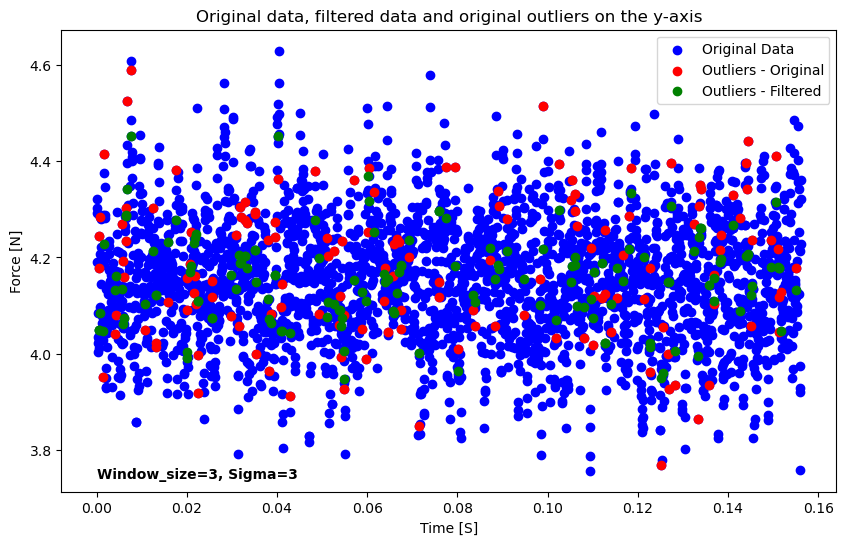

In [ ]:
# Plot the original data, filtered data and original outliers on the Y-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_y'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.00, 3.74, "Window_size=3, Sigma=3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()


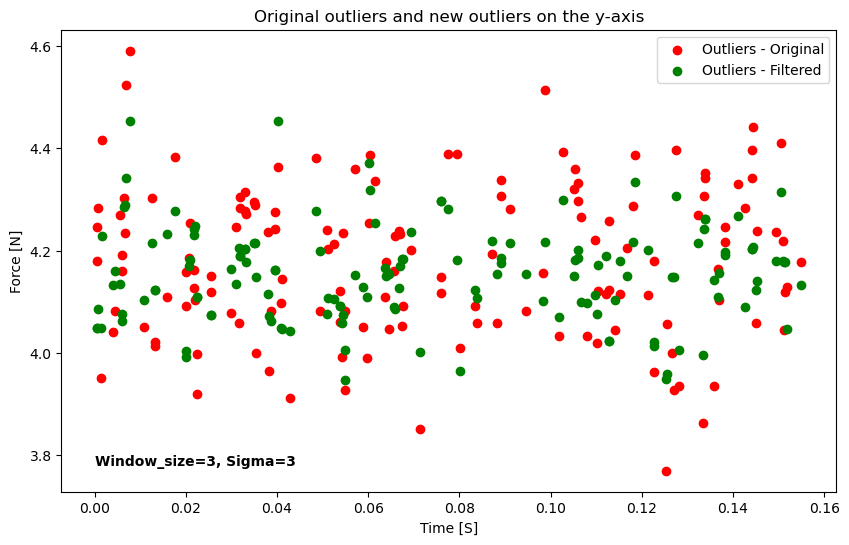

In [ ]:
# Scatter plot for original outliers and new outliers on the y-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.00, 3.78, "Window_size=3, Sigma=3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()


In [ ]:
# Using Square Root Rule to estimate the number of bins in Y-axis for the filtered data
num_bins_f_y = int(np.sqrt(len(filtered_data["F_y"][:3000])))
print(num_bins_f_y)

54


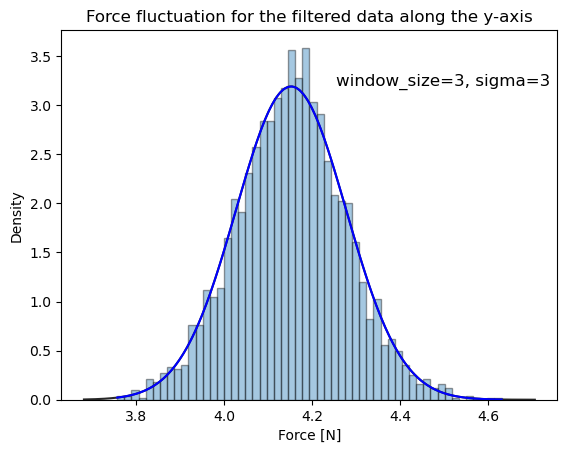

In [ ]:
# Filtered Data distribution at Y-axis with window_size=3 and n_sigma=3

data = filtered_data['F_y'][:3000]
# Filter out non-finite values
data = data[np.isfinite(data)]
# Plot the histogram
sns.distplot(data, bins=54, fit=norm, kde=False, hist_kws={"edgecolor": "black"})
# Fit the distribution
mu, sigma = norm.fit(data)
x = np.linspace(data.min(), data.max(), 100)
y = norm.pdf(x, mu, sigma)
plt.plot(x, y, color="b")
plt.xlabel("Force [N]")
plt.ylabel("Density")
plt.title("Force fluctuation for the filtered data along the y-axis")
plt.text(0.77, 0.86, 'window_size=3, sigma=3', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, fontsize=12)
plt.show()

#### Hampel filter for Z-axis with window_size=3 & sigma=3

In [ ]:
# Subset the dataframe
subset = df[["Time","F_z"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=3, n_sigma=3)


In [ ]:
# Statistical summary for the original data on Z-axis
df[['Time', 'F_z']][:3000].describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.063423
std,0.045113,0.737075
min,0.000000,-232.329361
25%,0.039049,-230.568504
50%,0.078099,-230.078430
75%,0.117148,-229.572449
max,0.156198,-227.761429


In [ ]:
# Statistical summary for the filtered data with window_size=3 and n_sigma=3 on the Z-axis
filtered_data.describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.063062
std,0.045113,0.719222
min,0.000000,-232.329361
25%,0.039049,-230.556347
50%,0.078099,-230.065170
75%,0.117148,-229.588329
max,0.156198,-227.761429


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_z']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_z)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_z']:
    original_value = subset.loc[index, 'F_z']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_z'] for index in outliers['F_z']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Z-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Z-axis:", len(new_values))

Number of original outliers on the Z-axis: 111
Number of filtered outliers on the Z-axis: 111


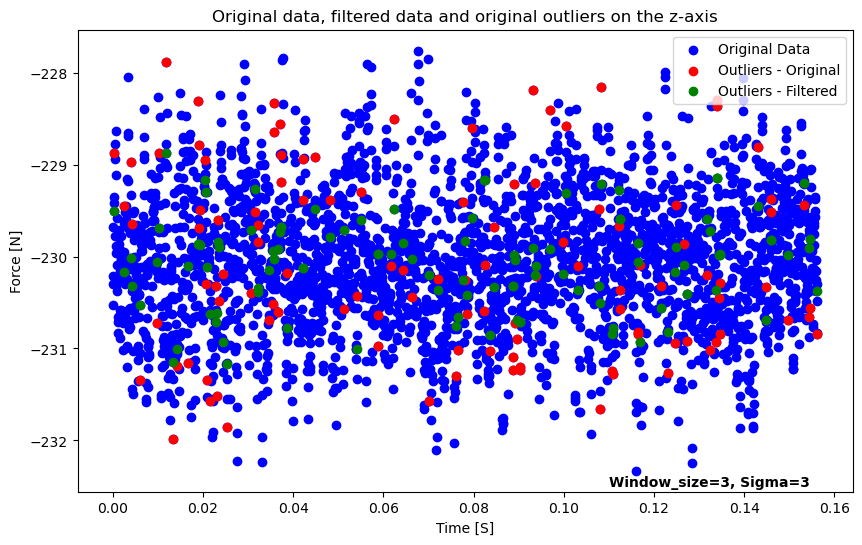

In [ ]:
# Plot the original data, filtered data and original outliers on the Z-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_z'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.11, -232.5, "Window_size=3, Sigma=3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

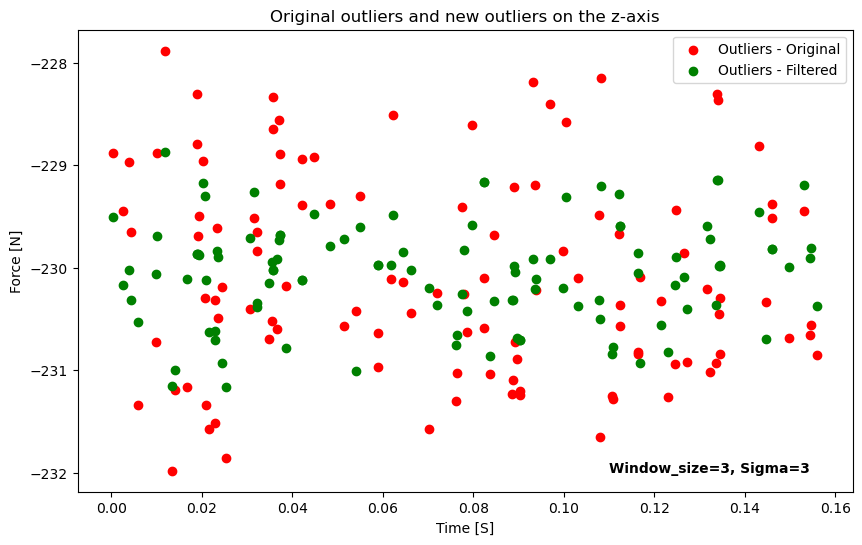

In [ ]:
# Scatter plot for original outliers and new outliers on the z-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.11, -232., "Window_size=3, Sigma=3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()


In [ ]:
# Using Square Root Rule to estimate the number of bins in Z-axis for the filtered data
num_bins_f_z = int(np.sqrt(len(filtered_data["F_z"][:3000])))
print(num_bins_f_z)

54


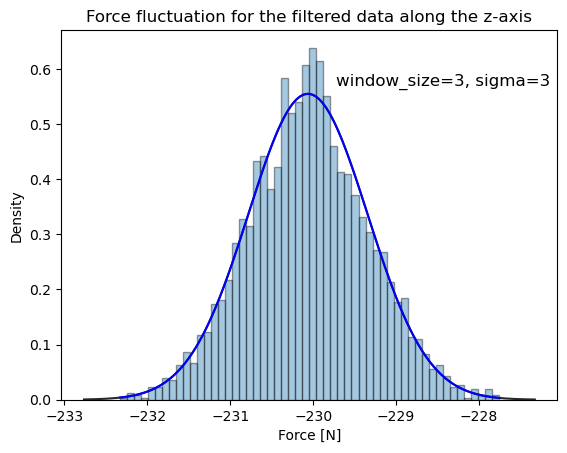

In [ ]:
# Filtered Data distribution at Z-axis with window_size=3 and n_sigma=3

data = filtered_data['F_z'][:3000]
# Filter out non-finite values
data = data[np.isfinite(data)]
# Plot the histogram
sns.distplot(data, bins=54, fit=norm, kde=False, hist_kws={"edgecolor": "black"})
# Fit the distribution
mu, sigma = norm.fit(data)
x = np.linspace(data.min(), data.max(), 100)
y = norm.pdf(x, mu, sigma)
plt.plot(x, y, color="b")
plt.xlabel("Force [N]")
plt.ylabel("Density")
plt.title("Force fluctuation for the filtered data along the z-axis")
plt.text(0.77, 0.86, 'window_size=3, sigma=3', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, fontsize=12)
plt.show()

### Applying the Hampel filter with setting window_size and sigma to 5

#### Hampel filter for X-axis with window_size=5 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_x"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=5, n_sigma=5)


In [ ]:
# Statistical summary for the original data on X-axis
df[['Time', 'F_x']][:3000].describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911108
std,0.045113,0.134965
min,0.000000,-7.384572
25%,0.039049,-7.002866
50%,0.078099,-6.916395
75%,0.117148,-6.818836
max,0.156198,-6.372138


In [ ]:
# Statistical summary for the filtered data with window_size=5 and n_sigma=5 on the X-axis
filtered_data.describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.910223
std,0.045113,0.133831
min,0.000000,-7.384572
25%,0.039049,-7.000641
50%,0.078099,-6.915003
75%,0.117148,-6.819434
max,0.156198,-6.372138


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_x']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_x)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_x']:
    original_value = subset.loc[index, 'F_x']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_x'] for index in outliers['F_x']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the X-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the X-axis:", len(new_values))


Number of original outliers on the X-axis: 24
Number of filtered outliers on the X-axis: 24


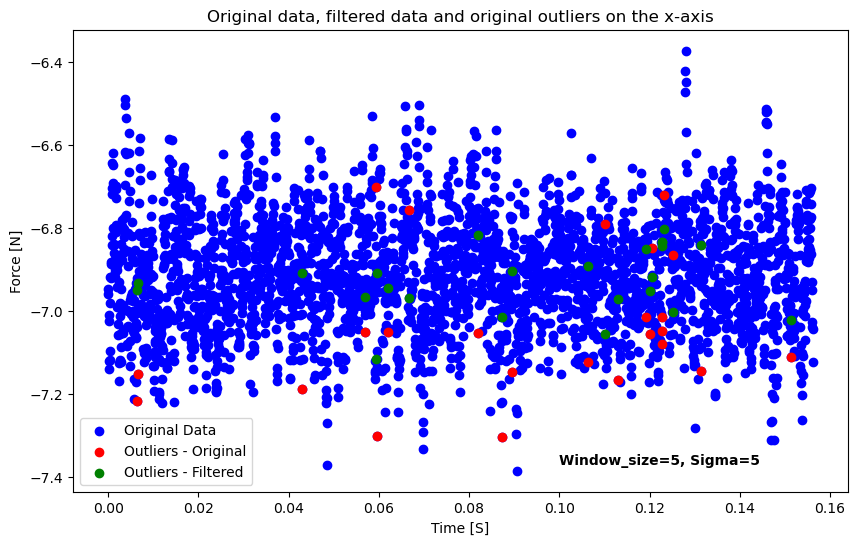

In [ ]:
# Plot the original data, filtered data and original outliers on the X-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_x'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.10, -7.37, "Window_size=5, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

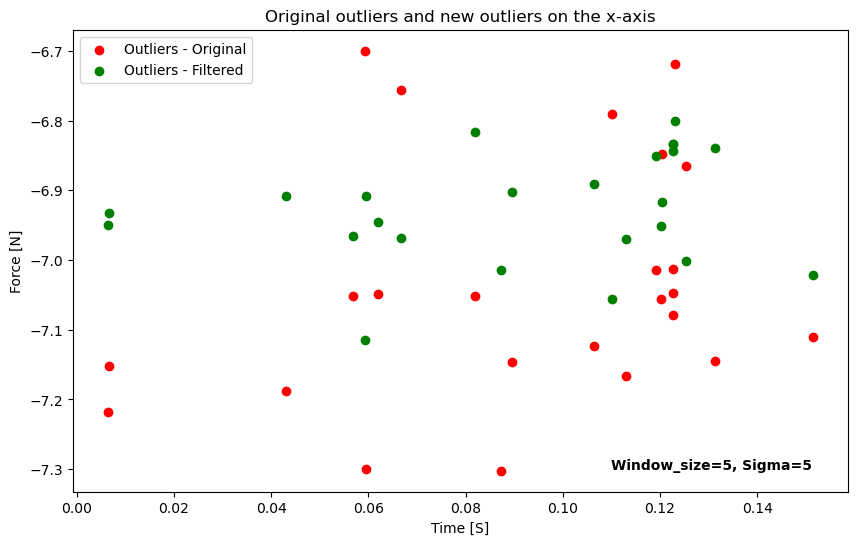

In [ ]:
# Scatter plot for original outliers and new outliers on the x-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.11, -7.3, "Window_size=5, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()


In [ ]:
# Using Square Root Rule to estimate the number of bins in Z-axis for the filtered data
num_bins_f_x = int(np.sqrt(len(filtered_data["F_x"][:3000])))
print(num_bins_f_x)

54


#### Hampel filter for Y-axis with window_size=5 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_y"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=5, n_sigma=5)


In [ ]:
# Statistical summary for the original data on Y-axis
df[['Time', 'F_y']][:3000].describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.152833
std,0.045113,0.127727
min,0.000000,3.756379
25%,0.039049,4.067976
50%,0.078099,4.152617
75%,0.117148,4.234664
max,0.156198,4.630175


In [ ]:
# Statistical summary for the filtered data with window_size=5 and n_sigma=5 on the Y-axis
filtered_data.describe()

,Time,F_y
count,3000.000000,3000.000000
mean,0.078099,4.152911
std,0.045113,0.127012
min,0.000000,3.756379
25%,0.039049,4.069579
50%,0.078099,4.152373
75%,0.117148,4.234215
max,0.156198,4.630175


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_y']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_y)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_y']:
    original_value = subset.loc[index, 'F_y']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_y'] for index in outliers['F_y']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Y-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Y-axis:", len(new_values))


Number of original outliers on the Y-axis: 30
Number of filtered outliers on the Y-axis: 30


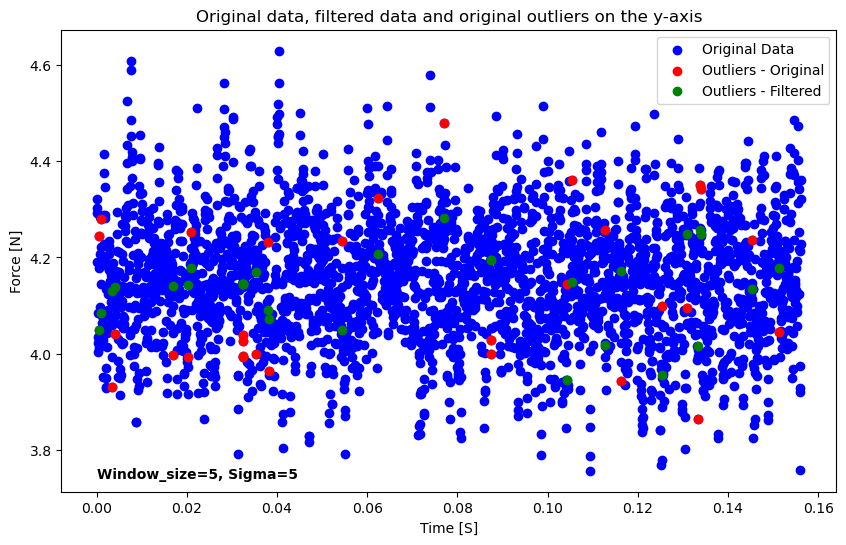

In [ ]:
# Plot the original data, filtered data and original outliers on the Y-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_y'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.00, 3.74, "Window_size=5, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

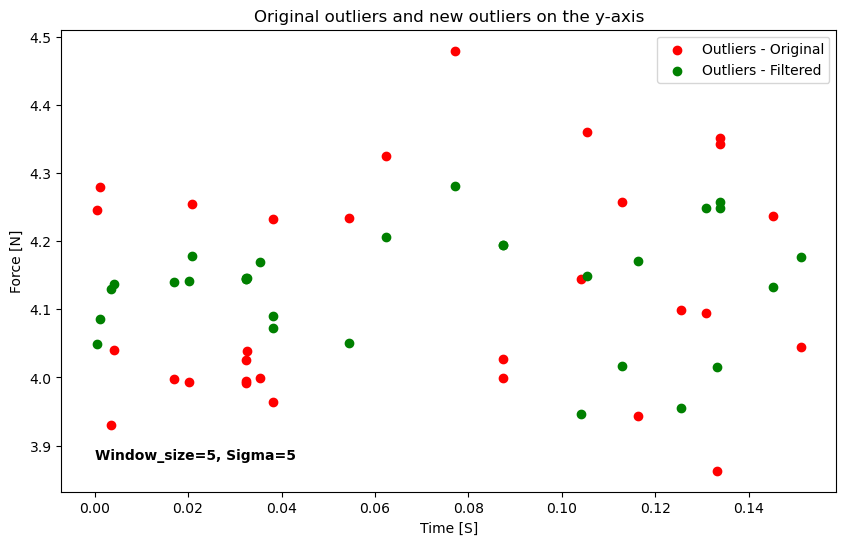

In [ ]:
# Scatter plot for original outliers and new outliers on the y-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.00, 3.88, "Window_size=5, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

In [ ]:
# Using Square Root Rule to estimate the number of bins in Y-axis for the filtered data
num_bins_f_y = int(np.sqrt(len(filtered_data["F_y"][:3000])))
print(num_bins_f_y)

54


#### Hampel filter for Z-axis with window_size=5 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_z"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=5, n_sigma=5)

In [ ]:
# Statistical summary for the original data on Z-axis
df[['Time', 'F_z']][:3000].describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.063423
std,0.045113,0.737075
min,0.000000,-232.329361
25%,0.039049,-230.568504
50%,0.078099,-230.078430
75%,0.117148,-229.572449
max,0.156198,-227.761429


In [ ]:
# Statistical summary for the filtered data with window_size=5 and n_sigma=5 on the Z-axis
filtered_data.describe()

,Time,F_z
count,3000.000000,3000.000000
mean,0.078099,-230.063097
std,0.045113,0.731720
min,0.000000,-232.329361
25%,0.039049,-230.563965
50%,0.078099,-230.076729
75%,0.117148,-229.574650
max,0.156198,-227.761429


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_z']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_z)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_z']:
    original_value = subset.loc[index, 'F_z']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_z'] for index in outliers['F_z']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Z-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Z-axis:", len(new_values))


Number of original outliers on the Z-axis: 20
Number of filtered outliers on the Z-axis: 20


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_z']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_z)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_z']:
    original_value = subset.loc[index, 'F_z']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_z'] for index in outliers['F_z']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Z-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Z-axis:", len(new_values))

Number of original outliers on the Z-axis: 20
Number of filtered outliers on the Z-axis: 20


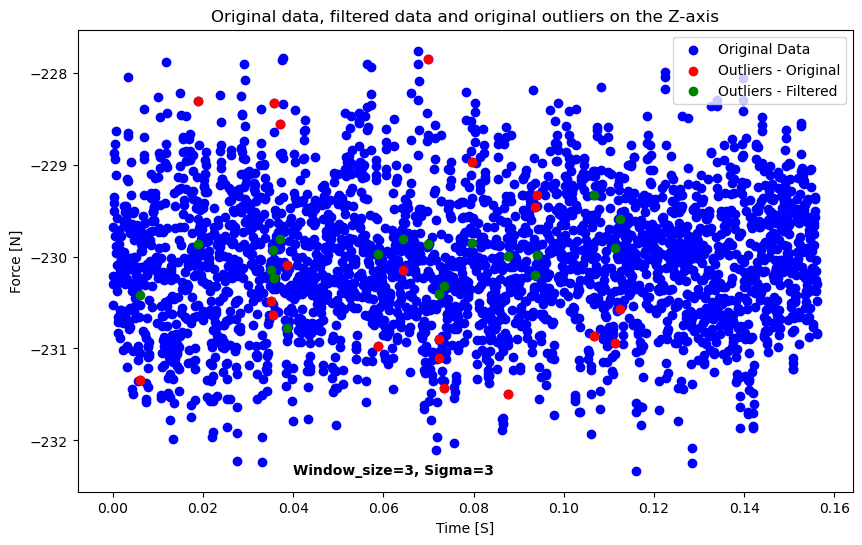

In [ ]:
# Plot the original data, filtered data and original outliers on the Z-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_z'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the Z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.04, -232.37, "Window_size=3, Sigma=3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

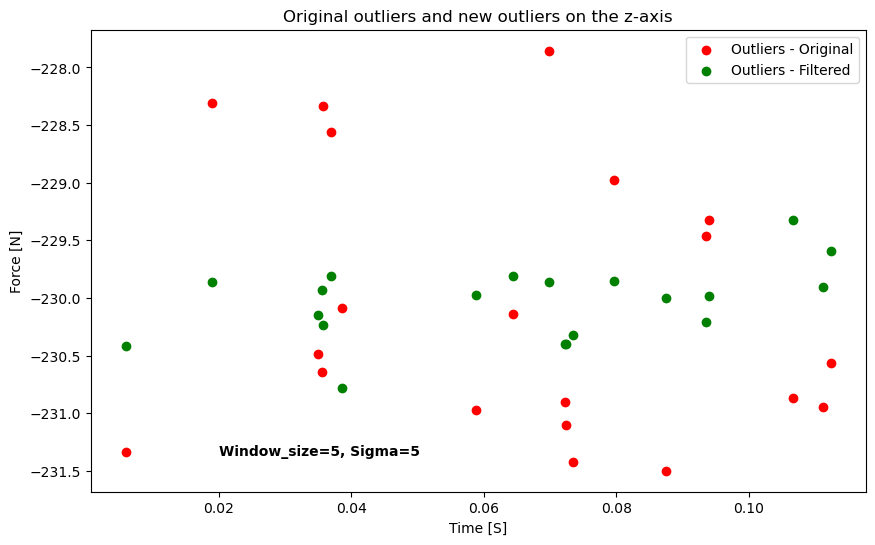

In [ ]:
# Scatter plot for original outliers and new outliers on the z-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.02, -231.37, "Window_size=5, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()


In [ ]:
# Using Square Root Rule to estimate the number of bins in Z-axis for the filtered data
num_bins_f_z = int(np.sqrt(len(filtered_data["F_z"][:3000])))
print(num_bins_f_z)

54


### Applying the Hampel filter with setting window_size and sigma to 10

#### Hampel filter for X-axis with window_size=10 & sigma=10

In [ ]:
# Subset the dataframe
subset = df[["Time","F_x"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=10, n_sigma=10)

In [ ]:
# Statistical summary for the original data on X-axis
df[['Time', 'F_x']][:3000].describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911108
std,0.045113,0.134965
min,0.000000,-7.384572
25%,0.039049,-7.002866
50%,0.078099,-6.916395
75%,0.117148,-6.818836
max,0.156198,-6.372138


In [ ]:
# Statistical summary for the filtered data with window_size=10 and n_sigma=10 on the X-axis
filtered_data.describe()

,Time,F_x
count,3000.000000,3000.000000
mean,0.078099,-6.911108
std,0.045113,0.134965
min,0.000000,-7.384572
25%,0.039049,-7.002866
50%,0.078099,-6.916395
75%,0.117148,-6.818836
max,0.156198,-6.372138


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_x']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_x)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_x']:
    original_value = subset.loc[index, 'F_x']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_x'] for index in outliers['F_x']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the X-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the X-axis:", len(new_values))


Number of original outliers on the X-axis: 0
Number of filtered outliers on the X-axis: 0


#### Hampel filter for Y-axis with window_size=10 & sigma=10

In [ ]:
# Subset the dataframe
subset = df[["Time","F_y"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=10, n_sigma=10)

In [ ]:
import matplotlib.pyplot as plt

# Subset the dataframe
subset = df[["Time","F_y"]]

# Set the window size and number of sigmas for the filter
window_size = 10
n_sigma = 10

# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=window_size, n_sigma=n_sigma)


In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_y']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_y)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_y']:
    original_value = subset.loc[index, 'F_y']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_y'] for index in outliers['F_y']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Y-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Y-axis:", len(new_values))


Number of original outliers on the Y-axis: 3
Number of filtered outliers on the Y-axis: 3


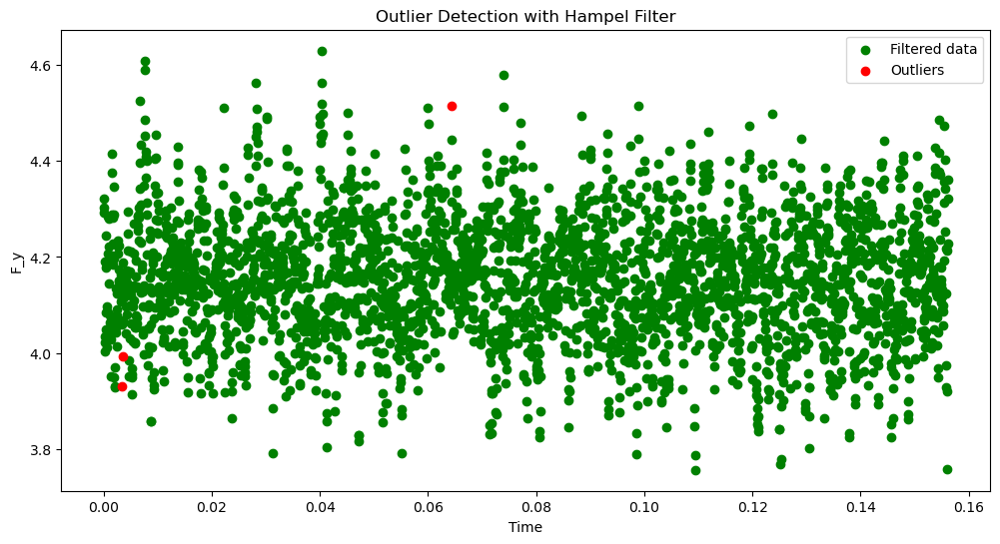

In [ ]:
# Plot original data ggg
plt.figure(figsize=(12,6))
#plt.scatter(subset['Time'][:3000], subset['F_y'][:3000], color='b', label='Original data')

# Plot filtered data
plt.scatter(filtered_data['Time'], filtered_data[filtered_data.columns[1]], color='g', label='Filtered data')
####

# Plot outliers
for column, column_outliers in outliers.items():
    times = [outlier['time'] for outlier in column_outliers.values()]
    values = [outlier['value'] for outlier in column_outliers.values()]
    plt.scatter(times, values, color='r', label='Outliers')

plt.legend()
plt.xlabel('Time')
plt.ylabel('F_y')
plt.title('Outlier Detection with Hampel Filter')
plt.show()


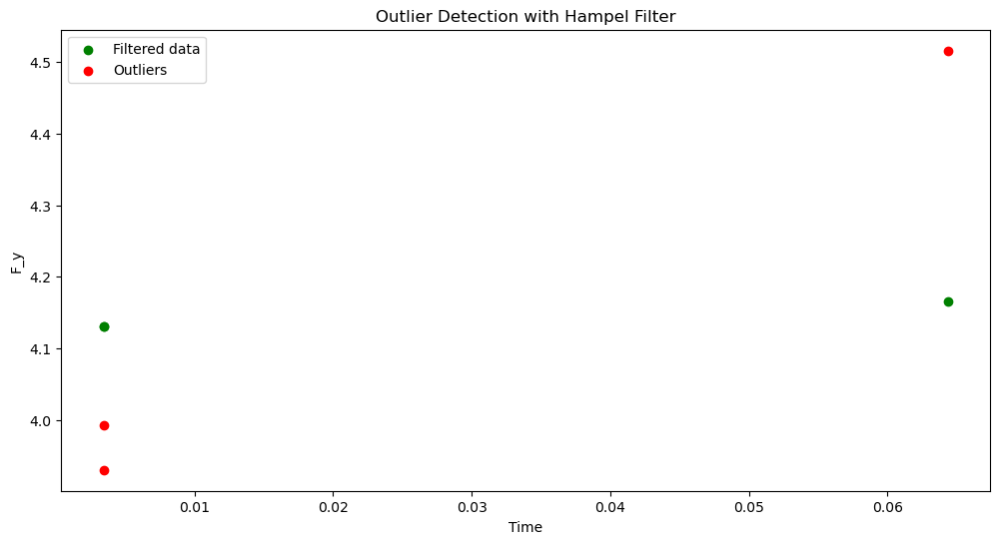

In [ ]:
import matplotlib.pyplot as plt

# Subset the dataframe
subset = df[["Time","F_y"]]

# Set the window size and number of sigmas for the filter
window_size = 10
n_sigma = 10

# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=window_size, n_sigma=n_sigma)

# Plot original data
plt.figure(figsize=(12,6))
#plt.scatter(subset['Time'][:3000], subset['F_y'][:3000], color='b', label='Original data')

# Prepare the filtered data that correspond to the outlier times
filtered_times = []
filtered_values = []
for index in outliers['F_y']:
    filtered_times.append(filtered_data.loc[index, 'Time'])
    filtered_values.append(filtered_data.loc[index, 'F_y'])

# Plot filtered data
plt.scatter(filtered_times, filtered_values, color='g', label='Filtered data')

# Plot outliers
for column, column_outliers in outliers.items():
    outlier_times = [outlier['time'] for outlier in column_outliers.values()]
    outlier_values = [outlier['value'] for outlier in column_outliers.values()]
    plt.scatter(outlier_times, outlier_values, color='r', label='Outliers')

plt.legend()
plt.xlabel('Time')
plt.ylabel('F_y')
plt.title('Outlier Detection with Hampel Filter')
plt.show()


In [ ]:
# Prepare the filtered data that correspond to the outlier times
filtered_times = []
filtered_values = []
for index in outliers['F_y']:
    filtered_times.append(filtered_data.loc[index, 'Time'])
    filtered_values.append(filtered_data.loc[index, 'F_y'])

# Print filtered times and values
print(filtered_times)
print(filtered_values)


[0.003437500163272489, 0.003489583499079648, 0.06437500305764843]
[4.130953788757324, 4.13003396987915, 4.165289402008057]


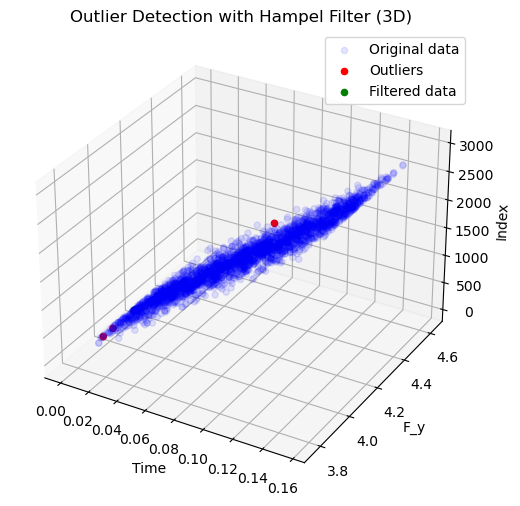

In [ ]:
# Subset the dataframe
subset = df[["Time","F_y"]]

# Set the window size and number of sigmas for the filter
window_size = 10
n_sigma = 10

# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=window_size, n_sigma=n_sigma)

# Prepare the filtered data that correspond to the outlier times
filtered_times = []
filtered_values = []
filtered_indices = []
for index in outliers['F_y']:
    filtered_times.append(filtered_data.loc[index, 'Time'])
    filtered_values.append(filtered_data.loc[index, 'F_y'])
    filtered_indices.append(index)

# Plot outliers
outlier_indices = []
outlier_times = []
outlier_values = []
for column, column_outliers in outliers.items():
    outlier_times.extend([outlier['time'] for outlier in column_outliers.values()])
    outlier_values.extend([outlier['value'] for outlier in column_outliers.values()])
    outlier_indices.extend(column_outliers.keys())

# Create 3D scatter plot
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for original data
ax.scatter(subset['Time'][:3000], subset['F_y'][:3000], np.arange(3000), color='b', alpha=0.1, label='Original data')

# Scatter plot for outliers
ax.scatter(outlier_times, outlier_values, outlier_indices, color='r', alpha=1, label='Outliers')

# Scatter plot for filtered data
ax.scatter(filtered_times, filtered_values, filtered_indices, color='g', alpha=1, label='Filtered data')

ax.legend()
ax.set_xlabel('Time')
ax.set_ylabel('F_y')
ax.set_zlabel('Index')
ax.set_title('Outlier Detection with Hampel Filter (3D)')

plt.show()


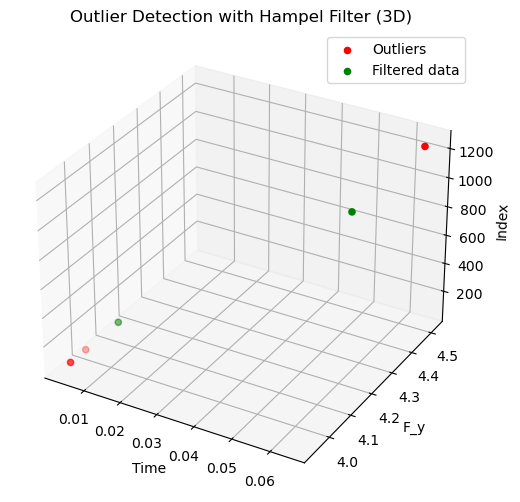

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Prepare the filtered data that correspond to the outlier times
filtered_times = []
filtered_values = []
filtered_indices = []
for index in outliers['F_y']:
    filtered_times.append(filtered_data.loc[index, 'Time'])
    filtered_values.append(filtered_data.loc[index, 'F_y'])
    filtered_indices.append(index)

# Plot outliers
outlier_indices = []
outlier_times = []
outlier_values = []
for column, column_outliers in outliers.items():
    outlier_times.extend([outlier['time'] for outlier in column_outliers.values()])
    outlier_values.extend([outlier['value'] for outlier in column_outliers.values()])
    outlier_indices.extend(column_outliers.keys())

# Create 3D scatter plot
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for outliers
ax.scatter(outlier_times, outlier_values, outlier_indices, color='r', label='Outliers')

# Scatter plot for filtered data
ax.scatter(filtered_times, filtered_values, filtered_indices, color='g', label='Filtered data')

ax.legend()
ax.set_xlabel('Time')
ax.set_ylabel('F_y')
ax.set_zlabel('Index')
ax.set_title('Outlier Detection with Hampel Filter (3D)')

plt.show()


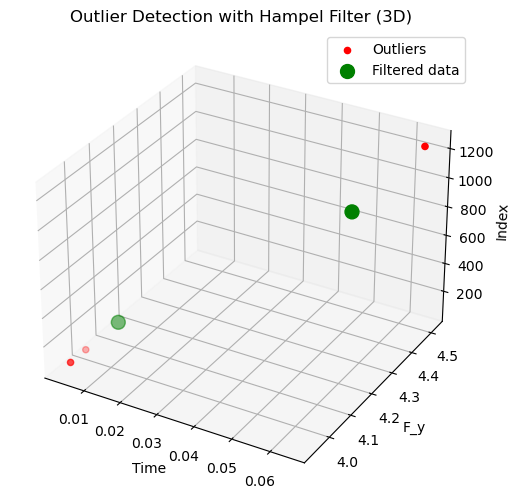

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Prepare the filtered data that correspond to the outlier times
filtered_times = []
filtered_values = []
filtered_indices = []
for index in outliers['F_y']:
    filtered_times.append(filtered_data.loc[index, 'Time'])
    filtered_values.append(filtered_data.loc[index, 'F_y'])
    filtered_indices.append(index)

# Plot outliers
outlier_indices = []
outlier_times = []
outlier_values = []
for column, column_outliers in outliers.items():
    outlier_times.extend([outlier['time'] for outlier in column_outliers.values()])
    outlier_values.extend([outlier['value'] for outlier in column_outliers.values()])
    outlier_indices.extend(column_outliers.keys())

# Create 3D scatter plot
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for outliers
#ax.scatter(outlier_times, outlier_values, outlier_indices, color='r', s=100, label='Outliers')

# Scatter plot for filtered data
#ax.scatter(filtered_times, filtered_values, filtered_indices, color='g', s=500, label='Filtered data')
# Scatter plot for outliers
ax.scatter(outlier_times, outlier_values, outlier_indices, color='r', label='Outliers')

# Scatter plot for filtered data
ax.scatter(filtered_times, filtered_values, filtered_indices, color='g', s=100, label='Filtered data')  # Increase point size

ax.legend()
ax.set_xlabel('Time')
ax.set_ylabel('F_y')
ax.set_zlabel('Index')
ax.set_title('Outlier Detection with Hampel Filter (3D)')

plt.show()


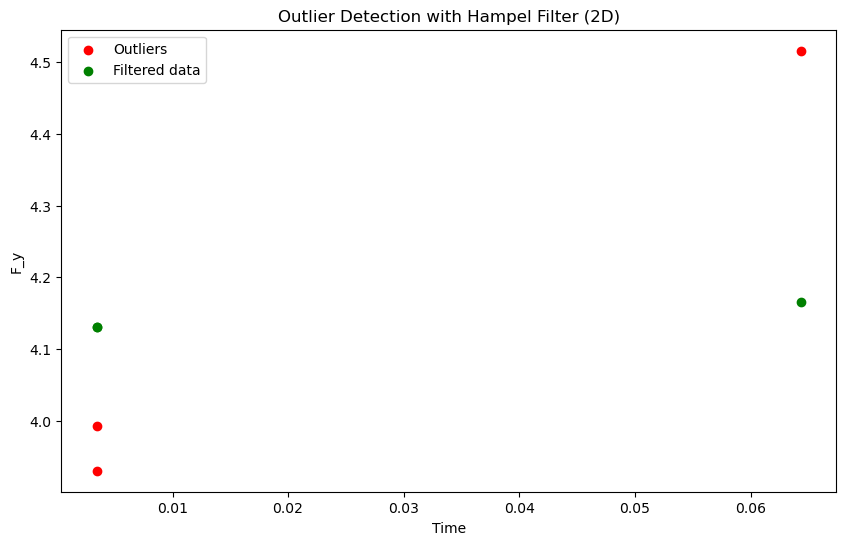

In [ ]:
# 2D scatter plot for outliers and filtered data
plt.figure(figsize=(10, 6))
plt.scatter(outlier_times, outlier_values, color='r', label='Outliers')
plt.scatter(filtered_times, filtered_values, color='g', label='Filtered data')

plt.legend()
plt.xlabel('Time')
plt.ylabel('F_y')
plt.title('Outlier Detection with Hampel Filter (2D)')

plt.show()


In [ ]:
# Prepare data
filtered_df = pd.DataFrame({
    'Time': filtered_times,
    'F_y': filtered_values,
    'Index': filtered_indices
})

outliers_df = pd.DataFrame({
    'Time': outlier_times,
    'F_y': outlier_values,
    'Index': outlier_indices
})

# Create 3D scatter plot
fig = px.scatter_3d(filtered_df, x='Time', y='F_y', z='Index', color='Index', title='Filtered data')
fig2 = px.scatter_3d(outliers_df, x='Time', y='F_y', z='Index', color='Index', title='Outliers')

# Show the plot
fig.show()
fig2.show()


In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(
    x=filtered_df['Time'],
    y=filtered_df['F_y'],
    z=filtered_df['Index'],
    mode='markers',
    marker=dict(
        size=6,
        color='green',   # set color to an array/list of desired values
        opacity=0.8
    )
)])

fig2 = go.Figure(data=[go.Scatter3d(
    x=outliers_df['Time'],
    y=outliers_df['F_y'],
    z=outliers_df['Index'],
    mode='markers',
    marker=dict(
        size=6,
        color='red',   # set color to an array/list of desired values
        opacity=0.8
    )
)])

# Show the plot
fig.show()
fig2.show()


In [ ]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(
    x=filtered_df['Time'],
    y=filtered_df['F_y'],
    z=filtered_df['Index'],
    mode='markers',
    marker=dict(
        size=6,
        color='green',   # set color to an array/list of desired values
        opacity=0.8
    )
)])

fig.update_layout(scene=dict(
    xaxis=dict(range=[filtered_df['Time'].min(), filtered_df['Time'].max()]),
    yaxis=dict(range=[filtered_df['F_y'].min(), filtered_df['F_y'].max()]),
    zaxis=dict(range=[filtered_df['Index'].min(), filtered_df['Index'].max()]),
))

fig2 = go.Figure(data=[go.Scatter3d(
    x=outliers_df['Time'],
    y=outliers_df['F_y'],
    z=outliers_df['Index'],
    mode='markers',
    marker=dict(
        size=6,
        color='red',   # set color to an array/list of desired values
        opacity=0.8
    )
)])

fig2.update_layout(scene=dict(
    xaxis=dict(range=[outliers_df['Time'].min(), outliers_df['Time'].max()]),
    yaxis=dict(range=[outliers_df['F_y'].min(), outliers_df['F_y'].max()]),
    zaxis=dict(range=[outliers_df['Index'].min(), outliers_df['Index'].max()]),
))

# Show the plot
fig.show()
fig2.show()


In [ ]:
fig = go.Figure(data=[go.Scatter3d(
    x=filtered_df['Time'],
    y=filtered_df['F_y'],
    z=filtered_df['Index'],
    mode='markers',
    marker=dict(
        size=6,
        color='green',   # set color to an array/list of desired values
        opacity=0.8
    )
)])

fig.update_layout(
    scene = dict(
        xaxis = dict(nticks=4, range=[filtered_df['Time'].min(),filtered_df['Time'].max()],),
                     yaxis = dict(nticks=4, range=[filtered_df['F_y'].min(),filtered_df['F_y'].max()],),
                     zaxis = dict(nticks=4, range=[filtered_df['Index'].min(),filtered_df['Index'].max()],),),
    width=700,
    margin=dict(r=20, l=10, b=10, t=10)
)

fig2 = go.Figure(data=[go.Scatter3d(
    x=outliers_df['Time'],
    y=outliers_df['F_y'],
    z=outliers_df['Index'],
    mode='markers',
    marker=dict(
        size=6,
        color='red',   # set color to an array/list of desired values
        opacity=0.8
    )
)])

fig2.update_layout(
    scene = dict(
        xaxis = dict(nticks=4, range=[outliers_df['Time'].min(),outliers_df['Time'].max()],),
                     yaxis = dict(nticks=4, range=[outliers_df['F_y'].min(),outliers_df['F_y'].max()],),
                     zaxis = dict(nticks=4, range=[outliers_df['Index'].min(),outliers_df['Index'].max()],),),
    width=700,
    margin=dict(r=20, l=10, b=10, t=10)
)

# Show the plot
fig.show()
fig2.show()


In [ ]:
fig = go.Figure(data=[go.Scatter3d(
    x=filtered_df['Time'],
    y=filtered_df['F_y'],
    z=filtered_df['Index'],
    mode='markers',
    marker=dict(
        size=6,
        color='green',   # set color to an array/list of desired values
        opacity=0.8
    )
)])

fig.update_layout(
    scene = dict(
        xaxis_title='Time [S]',
        yaxis_title='Force [N]',
        zaxis_title='Index',
        xaxis = dict(nticks=4, range=[filtered_df['Time'].min(),filtered_df['Time'].max()],),
        yaxis = dict(nticks=4, range=[filtered_df['F_y'].min(),filtered_df['F_y'].max()],),
        zaxis = dict(nticks=4, range=[filtered_df['Index'].min(),filtered_df['Index'].max()],),),
    width=700,
    margin=dict(r=20, l=10, b=10, t=10)
)

fig2 = go.Figure(data=[go.Scatter3d(
    x=outliers_df['Time'],
    y=outliers_df['F_y'],
    z=outliers_df['Index'],
    mode='markers',
    marker=dict(
        size=6,
        color='red',   # set color to an array/list of desired values
        opacity=0.8
    )
)])

fig2.update_layout(
    scene = dict(
        xaxis_title='Time [S]',
        yaxis_title='Force [N]',
        zaxis_title='Index',
        xaxis = dict(nticks=4, range=[outliers_df['Time'].min(),outliers_df['Time'].max()],),
        yaxis = dict(nticks=4, range=[outliers_df['F_y'].min(),outliers_df['F_y'].max()],),
        zaxis = dict(nticks=4, range=[outliers_df['Index'].min(),outliers_df['Index'].max()],),),
    width=700,
    margin=dict(r=20, l=10, b=10, t=10)
)

# Show the plot
fig.show()
fig2.show()


In [ ]:
# Prepare the filtered data that correspond to the outlier times
filtered_times = []
filtered_values = []
filtered_indices = []
for index in outliers['F_y']:
    filtered_times.append(filtered_data.loc[index, 'Time'])
    filtered_values.append(filtered_data.loc[index, 'F_y'])
    filtered_indices.append(index)
    print(f'Index: {index}, Time: {filtered_data.loc[index, "Time"]}, Value: {filtered_data.loc[index, "F_y"]}')


Index: 66, Time: 0.003437500163272489, Value: 4.130953788757324
Index: 67, Time: 0.003489583499079648, Value: 4.13003396987915
Index: 1236, Time: 0.06437500305764843, Value: 4.165289402008057


In [ ]:
fig = go.Figure(data=[go.Scatter3d(
    x=filtered_df['Time'],
    y=filtered_df['F_y'],
    z=filtered_df['Index'],
    mode='markers',
    marker=dict(
        size=6,
        color='green',   # set color to an array/list of desired values
        opacity=0.8
    )
)])

fig.update_layout(
    scene = dict(
        xaxis_title='Time [S]',
        yaxis_title='Force [N]',
        zaxis_title='Index',
        xaxis = dict(nticks=4, range=[filtered_df['Time'].min(),filtered_df['Time'].max()],),
        yaxis = dict(nticks=4, range=[filtered_df['F_y'].min(),filtered_df['F_y'].max()],),
        zaxis = dict(nticks=4, range=[filtered_df['Index'].min(),filtered_df['Index'].max()],),),
    width=700,
    title="New outliers on the y-axis",
    margin=dict(r=20, l=10, b=10, t=30),
    annotations=[
        dict(
            x=-0.02,
            y=0.4,
            showarrow=False,
            text="Window_size=10, Sigma=10",
            xref="paper",
            yref="paper",
            textangle=-306
        )
    ]
)

fig2 = go.Figure(data=[go.Scatter3d(
    x=outliers_df['Time'],
    y=outliers_df['F_y'],
    z=outliers_df['Index'],
    mode='markers',
    marker=dict(
        size=6,
        color='red',   # set color to an array/list of desired values
        opacity=0.8
    )
)])

fig2.update_layout(
    scene = dict(
        xaxis_title='Time [S]',
        yaxis_title='Force [N]',
        zaxis_title='Index',
        xaxis = dict(nticks=4, range=[outliers_df['Time'].min(),outliers_df['Time'].max()],),
        yaxis = dict(nticks=4, range=[outliers_df['F_y'].min(),outliers_df['F_y'].max()],),
        zaxis = dict(nticks=4, range=[outliers_df['Index'].min(),outliers_df['Index'].max()],),),
    width=700,
    title="Original outliers on the y-axis",
    margin=dict(r=20, l=10, b=10, t=30),
    annotations=[
        dict(
            x=-0.02,
            y=0.6,
            showarrow=False,
            text="Window_size=10, Sigma=10",
            xref="paper",
            yref="paper",
            textangle=360
        )
    ]
)

# Show the plot
fig.show()
fig2.show()













###### Hampel filter for Y-axis with window_size=10 & sigma=10

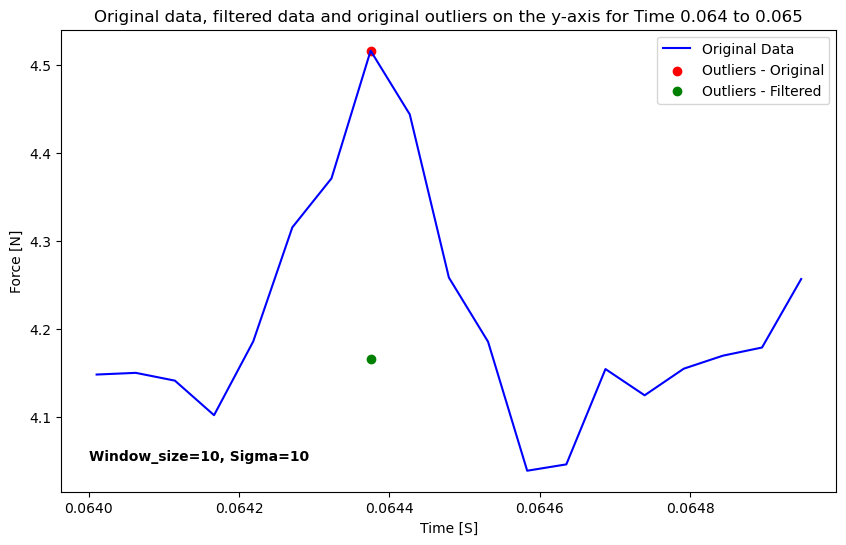

In [ ]:
# Filter dataframe for specified time range
subset_range = subset[(subset['Time'] >= 0.064) & (subset['Time'] <= 0.065)]

# Calculate outliers for new time range
outliers_time_range = [time for time in outliers_time if 0.06 <= time <= 0.065]
outliers_values_range = [value for time, value in zip(outliers_time, outliers_values) if 0.06 <= time <= 0.065]
new_values_range = [value for time, value in zip(outliers_time, new_values) if 0.06 <= time <= 0.065]

plt.figure(figsize=(10, 6))
plt.plot(subset_range['Time'], subset_range['F_y'], color='b', label='Original Data')
plt.scatter(outliers_time_range, outliers_values_range, color="r", label="Outliers - Original")
plt.scatter(outliers_time_range, new_values_range, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the y-axis for Time 0.064 to 0.065')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.0640, 4.05, "Window_size=10, Sigma=10", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()


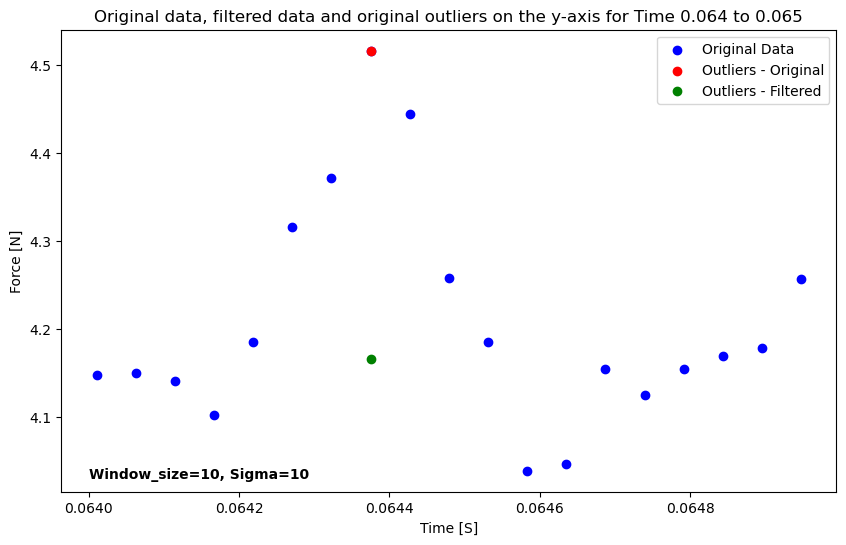

In [ ]:
# Filter dataframe for specified time range
subset_range = subset[(subset['Time'] >= 0.064) & (subset['Time'] <= 0.065)]

# Calculate outliers for new time range
outliers_time_range = [time for time in outliers_time if 0.06 <= time <= 0.065]
outliers_values_range = [value for time, value in zip(outliers_time, outliers_values) if 0.06 <= time <= 0.065]
new_values_range = [value for time, value in zip(outliers_time, new_values) if 0.06 <= time <= 0.065]

plt.figure(figsize=(10, 6))
plt.scatter(subset_range['Time'], subset_range['F_y'], color='b', label='Original Data')
plt.scatter(outliers_time_range, outliers_values_range, color="r", label="Outliers - Original")
plt.scatter(outliers_time_range, new_values_range, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the y-axis for Time 0.064 to 0.065')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.0640, 4.03, "Window_size=10, Sigma=10", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()


##### Hampel filter for Z-axis with window_size=10 & sigma=10

In [ ]:
# Subset the dataframe
subset = df[["Time","F_z"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=10, n_sigma=10)


In [ ]:
# Statistical summary for the original data on Z-axis
df[['Time', 'F_z']][:3000].describe()

In [ ]:
# Statistical summary for the filtered data with window_size=10 and n_sigma=10 on the Z-axis
filtered_data.describe()

In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_z']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_z)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_z']:
    original_value = subset.loc[index, 'F_z']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_z'] for index in outliers['F_z']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Z-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Z-axis:", len(new_values))


### Applying the Hampel filter with setting window_size and sigma to 20

#### Hampel filter for X-axis with window_size=20 & sigma=20

In [ ]:
# Subset the dataframe
subset = df[["Time","F_x"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=20, n_sigma=20)

In [ ]:
# Statistical summary for the original data on X-axis
df[['Time', 'F_x']][:3000].describe()

In [ ]:
# Statistical summary for the filtered data with window_size=20 and n_sigma=20 on the X-axis
filtered_data.describe()

In [ ]:
#To obtain the original F_x corresponding to key indices in outliers with window_size=20 and n_sigma=20

# Create an empty list to store the values and times
original_values = []
times = []
# Iterate over the indices in the dictionary
for index in outliers['F_x']:
    # Get the corresponding value and time using the index
    original_value = subset.loc[index, 'F_x']
    time_value = df.loc[index, 'Time']
    # Append the value and time to the lists
    original_values.append(original_value)
    times.append(time_value)

print("Number of outliers on the X-axis:", len(original_values))

#### Hampel filter for Y-axis with window_size=20 & sigma=20

In [ ]:
# Subset the dataframe
subset = df[["Time","F_y"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=20, n_sigma=20)

In [ ]:
# Statistical summary for the original data on Y-axis
df[['Time', 'F_y']][:3000].describe()

In [ ]:
# Statistical summary for the filtered data with window_size=20 and n_sigma=20 on the Y-axis
filtered_data.describe()

In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_y']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_y)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_y']:
    original_value = subset.loc[index, 'F_y']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_y'] for index in outliers['F_y']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Y-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Y-axis:", len(new_values))


#### Hampel filter for Z-axis with window_size=20 & sigma=20

In [ ]:
# Subset the dataframe
subset = df[["Time","F_z"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=20, n_sigma=20)

In [ ]:
# Statistical summary for the original data on Z-axis
df[['Time', 'F_z']][:3000].describe()

In [ ]:
# Statistical summary for the filtered data with window_size=20 and n_sigma=20 on the Z-axis
filtered_data.describe()

In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_z']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_z)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_z']:
    original_value = subset.loc[index, 'F_z']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_z'] for index in outliers['F_z']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Z-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Z-axis:", len(new_values))


#### Hampel filter for x-axis with window_size=20 & sigma=3

In [ ]:
# Subset the dataframe
subset = df[["Time","F_x"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=20, n_sigma=3)

In [ ]:
# Statistical summary for the original data on X-axis
df[['Time', 'F_x']][:3000].describe()

In [ ]:
# Statistical summary for the filtered data with window_size=20 and n_sigma=3 on the X-axis
filtered_data.describe()

In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_x']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_x)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_x']:
    original_value = subset.loc[index, 'F_x']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_x'] for index in outliers['F_x']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the X-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the X-axis:", len(new_values))


In [ ]:
# Plot the original data, filtered data and original outliers on the X-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_x'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.11, -7.38, "Window_size=20, Sigma=3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

In [ ]:
# Scatter plot for original outliers and new outliers on the x-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.11, -7.38, "Window_size=20, Sigma=3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()


In [ ]:
# Using Square Root Rule to estimate the number of bins in X-axis for the filtered data
num_bins_f_x = int(np.sqrt(len(filtered_data["F_x"][:3000])))
print(num_bins_f_x)

In [ ]:
# Filtered Data distribution at X-axis with window_size=20 and n_sigma=3

data = filtered_data['F_x'][:3000]
# Filter out non-finite values
data = data[np.isfinite(data)]
# Plot the histogram
sns.distplot(data, bins=54, fit=norm, kde=False, hist_kws={"edgecolor": "black"})
# Fit the distribution
mu, sigma = norm.fit(data)
x = np.linspace(data.min(), data.max(), 100)
y = norm.pdf(x, mu, sigma)
plt.plot(x, y, color="b")
plt.xlabel("Force [N]")
plt.ylabel("Density")
plt.title("Force fluctuation for the filtered data along the x-axis")
plt.text(0.77, 0.86, 'window_size=20, sigma=3', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, fontsize=12)
plt.show()

#### Hampel filter for y-axis with window_size=20 & sigma=3

In [ ]:
# Subset the dataframe
subset = df[["Time","F_y"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=20, n_sigma=3)

In [ ]:
# Statistical summary for the original data on Y-axis
df[['Time', 'F_y']][:3000].describe()

In [ ]:
# Statistical summary for the filtered data with window_size=20 and n_sigma=3 on the X-axis
filtered_data.describe()

In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_y']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_y)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_y']:
    original_value = subset.loc[index, 'F_y']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_y'] for index in outliers['F_y']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Y-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Y-axis:", len(new_values))


In [ ]:
# Plot the original data, filtered data and original outliers on the Y-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_y'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.00, 3.74, "Window_size=20, Sigma=3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

In [ ]:
# Scatter plot for original outliers and new outliers on the y-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.00, 3.74, "Window_size=20, Sigma=3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()


In [ ]:
# Using Square Root Rule to estimate the number of bins in y-axis for the filtered data
num_bins_f_y = int(np.sqrt(len(filtered_data["F_y"][:3000])))
print(num_bins_f_y)

In [ ]:
# Filtered Data distribution at Y-axis with window_size=20 and n_sigma=3

data = filtered_data['F_y'][:3000]
# Filter out non-finite values
data = data[np.isfinite(data)]
# Plot the histogram
sns.distplot(data, bins=54, fit=norm, kde=False, hist_kws={"edgecolor": "black"})
# Fit the distribution
mu, sigma = norm.fit(data)
x = np.linspace(data.min(), data.max(), 100)
y = norm.pdf(x, mu, sigma)
plt.plot(x, y, color="b")
plt.xlabel("Force [N]")
plt.ylabel("Density")
plt.title("Force fluctuation for the filtered data along the y-axis")
plt.text(0.77, 0.86, 'window_size=20, sigma=3', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, fontsize=12)
plt.show()

#### Hampel filter for z-axis with window_size=20 & sigma=3

In [ ]:
# Subset the dataframe
subset = df[["Time","F_z"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=20, n_sigma=3)

In [ ]:
# Statistical summary for the original data on Z-axis
df[['Time', 'F_z']][:3000].describe()

In [ ]:
# Statistical summary for the filtered data with window_size=20 and n_sigma=3 on the Z-axis
filtered_data.describe()

In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_z']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_z)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_z']:
    original_value = subset.loc[index, 'F_z']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_z'] for index in outliers['F_z']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Z-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Z-axis:", len(new_values))


In [ ]:
# Plot the original data, filtered data and original outliers on the Z-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_z'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.038, -232.4, "Window_size=20, Sigma=3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

In [ ]:
# Scatter plot for original outliers and new outliers on the z-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.05, -232.4, "Window_size=20, Sigma=3", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()


In [ ]:
# Using Square Root Rule to estimate the number of bins in z-axis for the filtered data
num_bins_f_z = int(np.sqrt(len(filtered_data["F_z"][:3000])))
print(num_bins_f_z)

In [ ]:
# Filtered Data distribution at Z-axis with window_size=20 and n_sigma=3

data = filtered_data['F_z'][:3000]
# Filter out non-finite values
data = data[np.isfinite(data)]
# Plot the histogram
sns.distplot(data, bins=54, fit=norm, kde=False, hist_kws={"edgecolor": "black"})
# Fit the distribution
mu, sigma = norm.fit(data)
x = np.linspace(data.min(), data.max(), 100)
y = norm.pdf(x, mu, sigma)
plt.plot(x, y, color="b")
plt.xlabel("Force [N]")
plt.ylabel("Density")
plt.title("Force fluctuation for the filtered data along the z-axis")
plt.text(0.77, 0.92, 'window_size=20, sigma=3', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, fontsize=12)
plt.show()

#### Hampel filter for x-axis with window_size=20 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_x"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=20, n_sigma=5)

In [ ]:
# Statistical summary for the original data on X-axis
df[['Time', 'F_x']][:3000].describe()

In [ ]:
# Statistical summary for the filtered data with window_size=20 and n_sigma=5 on the X-axis
filtered_data.describe()

In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_x']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_x)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_x']:
    original_value = subset.loc[index, 'F_x']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_x'] for index in outliers['F_x']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the X-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the X-axis:", len(new_values))


In [ ]:
# Plot the original data, filtered data and original outliers on the X-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_x'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.10, -7.4, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

In [ ]:
# Scatter plot for original outliers and new outliers on the x-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the x-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.10, -7.4, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

In [ ]:
# Using Square Root Rule to estimate the number of bins in x-axis for the filtered data
num_bins_f_x = int(np.sqrt(len(filtered_data["F_x"][:3000])))
print(num_bins_f_x)

In [ ]:
# Filtered Data distribution at X-axis with window_size=20 and n_sigma=5

data = filtered_data['F_x'][:3000]
# Filter out non-finite values
data = data[np.isfinite(data)]
# Plot the histogram
sns.distplot(data, bins=54, fit=norm, kde=False, hist_kws={"edgecolor": "black"})
# Fit the distribution
mu, sigma = norm.fit(data)
x = np.linspace(data.min(), data.max(), 100)
y = norm.pdf(x, mu, sigma)
plt.plot(x, y, color="b")
plt.xlabel("Force [N]")
plt.ylabel("Density")
plt.title("Force fluctuation for the filtered data along the x-axis")
plt.text(0.76, 0.90, 'window_size=20, sigma=5', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, fontsize=12)
plt.show()

#### Hampel filter for y-axis with window_size=20 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_y"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=20, n_sigma=5)

In [ ]:
# Statistical summary for the original data on Y-axis
df[['Time', 'F_y']][:3000].describe()

In [ ]:
# Statistical summary for the filtered data with window_size=20 and n_sigma=5 on the Y-axis
filtered_data.describe()

In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_y']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_y)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_y']:
    original_value = subset.loc[index, 'F_y']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_y'] for index in outliers['F_y']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Y-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Y-axis:", len(new_values))


In [ ]:
# Plot the original data, filtered data and original outliers on the Y-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_y'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.05, 3.74, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

In [ ]:
# Scatter plot for original outliers and new outliers on the y-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the y-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.05, 3.74, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

In [ ]:
# Using Square Root Rule to estimate the number of bins in y-axis for the filtered data
num_bins_f_y = int(np.sqrt(len(filtered_data["F_y"][:3000])))
print(num_bins_f_y)

In [ ]:
# Filtered Data distribution at Y-axis with window_size=20 and n_sigma=5

data = filtered_data['F_y'][:3000]
# Filter out non-finite values
data = data[np.isfinite(data)]
# Plot the histogram
sns.distplot(data, bins=54, fit=norm, kde=False, hist_kws={"edgecolor": "black"})
# Fit the distribution
mu, sigma = norm.fit(data)
x = np.linspace(data.min(), data.max(), 100)
y = norm.pdf(x, mu, sigma)
plt.plot(x, y, color="b")
plt.xlabel("Force [N]")
plt.ylabel("Density")
plt.title("Force fluctuation for the filtered data along the y-axis")
plt.text(0.76, 0.90, 'window_size=20, sigma=5', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, fontsize=12)
plt.show()

#### Hampel filter for z-axis with window_size=20 & sigma=5

In [ ]:
# Subset the dataframe
subset = df[["Time","F_z"]]
# Apply the filter
filtered_data, outliers = hampel_filter(subset[:3000], window_size=20, n_sigma=5)

In [ ]:
# Statistical summary for the original data on Z-axis
df[['Time', 'F_z']][:3000].describe()

In [ ]:
# Statistical summary for the filtered data with window_size=20 and n_sigma=5 on the Z-axis
filtered_data.describe()

In [ ]:
# Create outlier DataFrame
outliers_df = pd.DataFrame.from_dict(outliers)

data = outliers_df['F_z']
outliers_values = [d['value'] for d in data]
outliers_time = [d['time'] for d in data]

outliers_df = pd.DataFrame({'Outliers (F_z)': outliers_values, 'Time': outliers_time})

# Collect the original outlier values and their times
original_values = []
times = []
for index in outliers['F_z']:
    original_value = subset.loc[index, 'F_z']
    time_value = df.loc[index, 'Time']
    original_values.append(original_value)
    times.append(time_value)

# Extract the new values for the outliers (filtered)
new_values = [filtered_data.loc[index, 'F_z'] for index in outliers['F_z']]

# Print the DataFrame (original outliers)
print("Number of original outliers on the Z-axis:", len(outliers_df))
# Print the DataFrame (filtered outliers)
print("Number of filtered outliers on the Z-axis:", len(new_values))


In [ ]:
# Plot the original data, filtered data and original outliers on the Z-axis
plt.figure(figsize=(10, 6))
plt.scatter(subset['Time'][:3000], subset['F_z'][:3000], color='b', label='Original Data')
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original data, filtered data and original outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.05, -232.4, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

In [ ]:
# Scatter plot for original outliers and new outliers on the z-axis
plt.figure(figsize=(10, 6))
plt.scatter(outliers_time, outliers_values, color="r", label="Outliers - Original")
plt.scatter(outliers_time, new_values, color="g", label="Outliers - Filtered")
plt.title('Original outliers and new outliers on the z-axis')
plt.xlabel('Time [S]')
plt.ylabel('Force [N]')
plt.text(0.05, -231.7, "Window_size=20, Sigma=5", horizontalalignment='left', size='medium', color='black', weight='semibold')
plt.legend()
plt.show()

In [ ]:
# Using Square Root Rule to estimate the number of bins in z-axis for the filtered data
num_bins_f_z = int(np.sqrt(len(filtered_data["F_z"][:3000])))
print(num_bins_f_z)

In [ ]:
# Filtered Data distribution at Z-axis with window_size=20 and n_sigma=5

data = filtered_data['F_z'][:3000]
# Filter out non-finite values
data = data[np.isfinite(data)]
# Plot the histogram
sns.distplot(data, bins=54, fit=norm, kde=False, hist_kws={"edgecolor": "black"})
# Fit the distribution
mu, sigma = norm.fit(data)
x = np.linspace(data.min(), data.max(), 100)
y = norm.pdf(x, mu, sigma)
plt.plot(x, y, color="b")
plt.xlabel("Force [N]")
plt.ylabel("Density")
plt.title("Force fluctuation for the filtered data along the z-axis")
plt.text(0.77, 0.90, 'window_size=20, sigma=5', horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, fontsize=12)
plt.show()

<a name="summary"></a>
## 5. Summary

###### This notebook focuses on analyzing the vibration of a circular cylinder subjected to a force at 70Hz. The presence of wires introduces a fundamental force, leading to vibrations that modify the static conditions. The objective is to preprocess the data for develop a  deep learning model capable of separating and identifying the constant forces from the dynamic effects.
###### The notebook begins by importing the required libraries and loading the data. Exploratory data analysis and preparation are performed to gain insights into the dataset. Steps are taken to handle missing values and duplicates, ensuring data integrity.
###### Outliers can significantly impact data analysis results, leading to erroneous conclusions. To address this, the notebook applies the Hampel filter technique for outlier detection. The Hampel filter algorithm utilizes Median Absolute Deviation and Median, enhancing its robustness against outliers. The notebook experiments with different values for the Hampel filter parameters, such as window size and sigma.
###### The data in the notebook comprises columns representing Time, X-axis, Y-axis, and Z-axis. For further analysis, deep learning technologies can be applied to the dataset. Deep learning models have the potential to uncover meaningful patterns and relationships in this data.
######  the notebook aims to preprocess the vibration data of the circular cylinder and develop a model that can effectively separate and identify the constant force and dynamic effects.
###### Since the data frame is unlabeled, we will need to label the data to create a target variable indicating whether each data point corresponds to a constant forces or dynamic effect, this can be done through expert knowledge, domain understanding, or by using external sources if available.

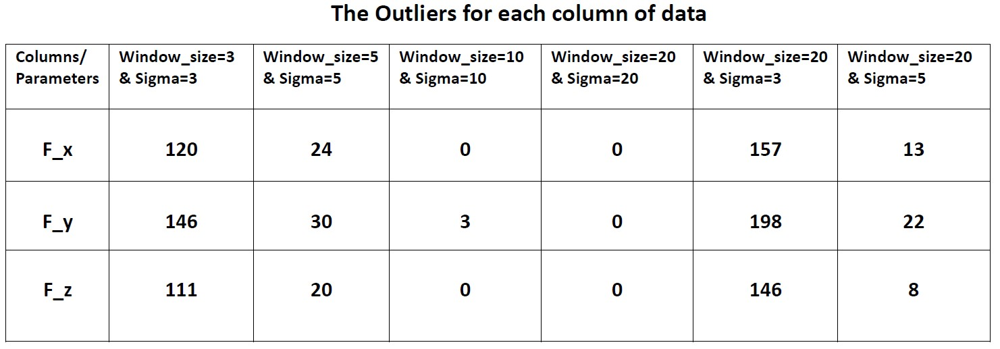

In [ ]:
#The numbers of outliers per columns
image_path = 'Outliers.jpg'
Image(filename=image_path)